# Исследование объявлений об аренде квартир

В январе 2025 мы загрузили данные об аренде квартир в Москве с сайта cian.ru.

Наша цель — научиться определять рыночную стоимость аренды недвижимости. Для этого необходимо установить ключевые параметры, которые лягут в основу автоматизированной системы. Она позволит выявлять аномалии и случаи мошенничества.

По каждой сдаваемой в аренду квартире доступны два типа данных: введённые арендодателем и автоматически рассчитанные на основе картографической информации. К последним относятся, например, расстояние до центра, количество социальных объектов, а также число парков и спортивных площадок в зоне доступности и т.п.

## Описание данных

**metro** (text)	-             Ближайшее метро

**walk_to_metro_flg**	(bool)	-	Флаг пешей доступности

**address**	(text)	-	Адрес

**price**	(float8) -	Цена, руб.

**m_sqarea**	(float8)	-	Метраж, кв.м

**floor_flat**	(float8)	-	Этаж

**floor_max**	(float8)	-	Этажность дома

**rooms**	(int8)	-	Количество комнат

**latitude**	(float8) -	Широта

**longitude**	(float8)	-	Долгота

**district_name** (text) - Округ

**dist_to_center**	(float8)	-	Дальность от Кремля

**r_per_meter**	(float8)	-	Рублей за метр

**room_square**	(float8)	-	Средняя площадь комнаты

**Холодильник**	(int8)	-	Наличие	холодильника

**Посудомоечная машина**	(int8)	-	Наличие	посудомоечной машины

**Стиральная машина**	(int8)	-	Наличие	стиральной машины

**Кондиционер**	(int8)	-	Наличие кондиционера

**Телевизор**	(int8)	-	Наличие телевизора

**Интернет**	(int8)	-	Наличие интернета

**Мебель на кухне**	(int8)	-	Наличие мебели на кухне

**Мебель в комнатах**	(int8)	-	Наличие	мебели в комнатах

**Оплата ЖКХ**	(text)	-	Входит ли стоимость в оплату

**Залог**	(int4) -	Сумма, руб.

**Предоплата_месяцев**	(int4)	-	Кол-во месяцев

**Срок аренды**	(text)	-	От года или нет

**С животными**	(bool)	-	Разрешено ли

**С детьми**	(bool)	-	Разрешено ли

**Общая площадь**	(float8)	-	Площадь, кв.м

**Жилая площадь**	(float8)	-	Площадь, кв.м

**Площадь кухни**	(float8)	-	Площадь, кв.

**Санузел**	(text)	-	Тип и кол-во

**Балкон/лоджия**	(text)	-	Тип и кол-во

**Вид из окон**	(text)	-	Куда выходят окна

**Ремонт**	(text)	-	Тип ремонта

**Год постройки**	(float8)	-	Год постройки

**Количество лифтов**	(text)	Дискретная количественная	Тип и кол-во

**Тип перекрытий**	(text)	-	Тип

**Парковка**	(text)	-	  Тип

**Отопление**	(text) -	  Тип

**Аварийность**	(int4)	-	Да или нет

**school_1000m**	(int8)	-	Кол-во школ в радиусе

**shops_200m**	(int8)	-	Кол-во магазинов в радиусе

**theatre_1000m**	(int8)	-	Кол-во театров в радиусе

**fitness_500m**	(int8)	-	Кол-во спортзалов в радиусе

**cinemas_1500m**	(int8)	-	Кол-во кинотеатров в радиусе

**foods_1000m**	(int8)	-	Кол-во точек питания в радиусе

**kindergarten_500m**	(int8)	-	Кол-во детсадов в радиусе	500 м

**libraries_1000m**	(int8)	-	Кол-во библиотек в радиусе 1000 м

**parks_2000m**	(int8)	-	Кол-во парков в радиусе	2000 м

**post_office_1000m**	(int8)	-	Кол-во почт в радиусе	1000 м

**climbing_1000m**	(int8)	-	Кол-во скалодромов в радиусе 1000 м

**fields_1000m**	(int8)	-	Кол-во футб. полей в радиусе 1000 м

**indoor_swimming_pool_1000m**	(int8)	-	Кол-во бассейнов в радиусе

**malls_2000m**	(int8)	-	Кол-во тц в радиусе

**outdoor_swimming_pool_1000m**	(int8)	-	Кол-во открытых бассейнов в радиусе

**is_first_floor**	(bool)	-	Первый этаж

**is_max_floor**	(bool)	-	Последний этаж дома

## Импорт библиотек

In [437]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import branca.colormap as cm

In [438]:
pd.set_option('display.max_columns', None)

## Изучение данных из файла

In [439]:
df = pd.read_csv('/content/dataset.csv')
display(df.head())

,metro,walk_to_metro_flg,address,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,district_name,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Оплата ЖКХ,Залог,Предоплата_месяцев,Срок аренды,С животными,С детьми,Общая площадь,Жилая площадь,Площадь кухни,Санузел,Балкон/лоджия,Вид из окон,Ремонт,Год постройки,Количество лифтов,Тип перекрытий,Парковка,Отопление,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,is_first_floor,is_max_floor
0,tbd,False,"Москва, ВАО, р-н Новогиреево, Фрязевская улица...",55000.0,35.4,2.0,9.0,1,55.747191,37.823835,Восточный административный округ,12.0,1553.0,35.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,включены в сумму,55000.0,1.0,несколько месяцев,False,True,35.4,20.0,10.0,1 совмещенный,NaN,Во двор,Косметический,1968.0,1 пассажирский,Железобетонные,ПарковкаНаземная,Центральное,0.0,19,1,1,0,0,80,2,2,12,0,0,0,0,22,0,False,False
1,tbd,False,"Москва, НАО (Новомосковский), Кленовые Аллеи Ж...",65000.0,40.0,17.0,17.0,1,55.512301,37.353144,Троицкий административный округ,31.0,1625.0,40.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,включены в сумму,30000.0,1.0,несколько месяцев,False,True,40.0,25.0,10.0,1 совмещенный,1 балкон,На улицу,Евроремонт,NaN,"1 пассажирский, 1 грузовой",NaN,Наземная,NaN,NaN,4,5,0,0,0,43,1,0,3,0,0,0,0,0,0,False,True
2,tbd,False,"Москва, НАО (Новомосковский), улица Кварцевая,...",55000.0,42.0,9.0,16.0,2,55.491222,37.337199,Троицкий административный округ,34.0,1309.0,21.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,55000.0,1.0,от года,False,True,42.0,21.0,16.0,1 совмещенный,1 лоджия,На улицу,Евроремонт,2022.0,"1 пассажирский, 1 грузовой",Железобетонные,Наземная,Индивидуальный тепловой пункт,0.0,0,6,0,0,0,3,0,0,2,0,0,0,0,0,0,False,False
3,tbd,False,"Москва, НАО (Новомосковский), улица Кварцевая,...",50000.0,41.8,5.0,13.0,1,55.488621,37.338017,Троицкий административный округ,34.0,1196.0,41.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,55000.0,1.0,от года,NaN,NaN,41.8,22.0,10.0,1 совмещенный,1 лоджия,NaN,Дизайнерский,2022.0,"1 пассажирский, 1 грузовой",Железобетонные,ПарковкаНаземная,Индивидуальный тепловой пункт,0.0,0,4,0,0,0,3,0,0,2,0,0,0,0,0,0,False,False
4,tbd,False,"Москва, НАО (Новомосковский), улица Кварцевая,...",40000.0,40.0,11.0,14.0,1,55.487448,37.336903,Троицкий административный округ,34.0,1000.0,40.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,счетчики отдельно,38000.0,1.0,от года,NaN,NaN,40.0,NaN,10.0,1 совмещенный,1 балкон,На улицу,Косметический,2022.0,NaN,Железобетонные,Наземная,Индивидуальный тепловой пункт,0.0,0,4,0,0,0,3,0,0,1,0,0,0,0,0,0,False,False


In [440]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16060 entries, 0 to 16059
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   metro                        16060 non-null  object 
 1   walk_to_metro_flg            16060 non-null  bool   
 2   address                      16060 non-null  object 
 3   price                        16060 non-null  float64
 4   m_sqarea                     16060 non-null  float64
 5   floor_flat                   16060 non-null  float64
 6   floor_max                    16060 non-null  float64
 7   rooms                        16060 non-null  int64  
 8   latitude                     16060 non-null  float64
 9   longitude                    16060 non-null  float64
 10  district_name                16057 non-null  object 
 11  dist_to_center               16060 non-null  float64
 12  r_per_meter                  16060 non-null  float64
 13  room_square     

In [441]:
# Визуализация пропусков
!pip install missingno

In [442]:
import missingno as msno

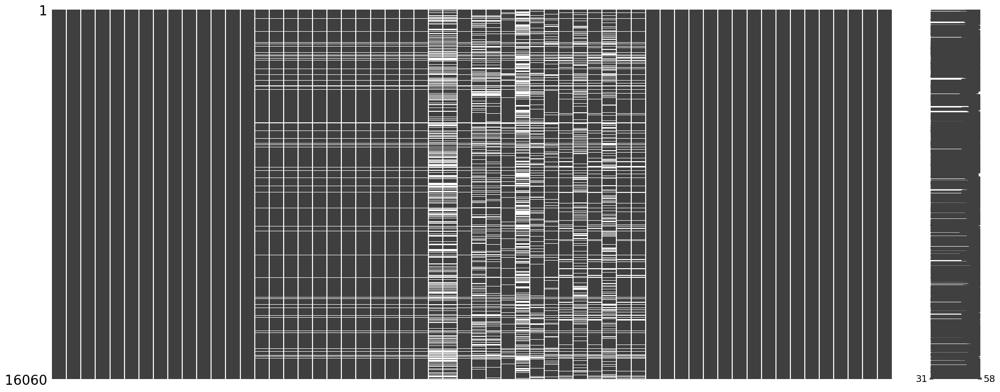

In [443]:
msno.matrix(df)
plt.show()

In [444]:
print(f"""В датасете содержится
{df.shape[0]} строк
{df.shape[1]} столбцов
{len(df.isna().sum()[df.isna().sum()>0])}/{df.shape[1]} содержат пропуски""")

В датасете содержится
16060 строк
58 столбцов
28/58 содержат пропуски


### Вывод

В данных наблюдаются пропуски, которые требуют замены.

В данных отсуствует пул характеристик для примерно 900 строк в таких столбцах как Общая площадь, Холодильник, Посудомоечная машина, Стиральная машина, Кондиционер, Телевизор, Интернет, Мебель на кухне, Мебель в комнатах, Оплата ЖКХ, Залог, Предоплата_месяцев, Срок аренды. Эти строки стоит удалить.

В других столбцах есть пропущенные значения, их стоит рассмотреть отдельно и заменить

## Предобработка данных

### 1. Обработка пропусков

**Дальнейшие действия**:
1. Проверяем данные на полные дубликаты. Всего **16060** строк.
2. Удаляем полностью строки, в которых не заполнен пул данных в столбцах Общая площадь, Холодильник, Посудомоечная машина, Стиральная машина, Кондиционер, Телевизор, Интернет, Мебель на кухне, Мебель в комнатах, Оплата ЖКХ, Залог, Предоплата_месяцев, Срок аренды (не распарсились из-за ошибки на странице обявления).

   Остается **15116** строк
   
   и 15 столбцов с пропусками:

 -  Аварийность
 -  Количество лифтов
 -  Санузел
 -  district_name
 -  Парковка
 -  Год постройки
 -  С животными
 -  С детьми
 -  Жилая площадь
 -  Площадь кухни
 -  Балкон/лоджия
 -  Вид из окон
 -  Ремонт
 -  Тип перекрытий
 -  Отопление


 3. По указанным 15 столбцам ищу уникальные значения и произвожу замену.
 - '**Аварийность**' - заменяю пропуски на 0 - наиболее популярное значение (аварийных домов из данных всего 1)
 - '**Количество лифтов**' - заменяю на самое популярное значение для данного вида этажности. Ввожу новый признак наличие грузового лифта и сумма лифтов
 - '**Санузел**' - заменяю на самое поплуряное значение для данного вида комнатности. Плюс создаю доп. признаки: сумма санузлов и наличие совмещенного санузла
 - '**district_name**' - всего три пропуска, заменяю их с учетом аббревиатуры округа в адресе
 - '**Парковка**' - пропуски заменяю на 'Наземная', помимо пропусков присутсвуют некорретные названия, которые меняю по смыслу на существующие признаки, например 'ПарковкаНаземная' на 'Наземная' или 'Открытая' на 'Наземная'
 - '**Год постройки**' - заменяю часть пропусков на такой же год, который имеет такой же адрес в других объявлениях. Также удаляею строки, где год построки 2026, т.к. он еще не наступил. Заменяю оставшиеся пропуски наиболее часто встречающимся по районам
 - '**С животными**', '**С детьми**' - ввожу новый признак 'По договоренности'
 - '**Балкон/лоджия**' - пропуски заменяю на новый признак 'нет'. Добавим два дополнительных признака: сумма балконов/лоджий и их наличие да/нет
 - '**Отопление**', '**Тип перекрытий**' - заменяю на существующий признак 'Нет информации'
 - '**post_office_1000m**' - отсутвуют значения, т.е. везде 0, поэтому этот столбец можно удалить
 - '**Ремонт**' - заменяю пропуски на самое популярное значение для данного года постройки
 - '**Площадь кухни**' - создадим дополнительный признак "доля площади кухни к площади квартиры" и заменим пропуски в новом столбце на наиболее популярное значение по году постройки и по комнатности, затем пропуски в ст. "Площадь кухни" заменим на произведение "Общей площади" на "Долю кухни".
 - '**Жилая площадь**' - создадим дополнительный признак "доля общей площади к площади квартиры" и заменим пропуски в новом столбце на наиболее популярное значение по году постройки и по комнатности, затем пропуски в ст. "Жилая площадь" заменим на произведение "Общей площади" на "Долю жилой площади".
 - **Вид из окон** - имеет 13.40% пропусков. Как показал анализ, отличия по цене не сильные, этот столбец можно исключить.

##### 1. **Проверка данных на полные дубликаты и % пропусков**

In [445]:
# Проверим и удалим строки на полные дубликаты
df = df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16060 entries, 0 to 16059
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   metro                        16060 non-null  object 
 1   walk_to_metro_flg            16060 non-null  bool   
 2   address                      16060 non-null  object 
 3   price                        16060 non-null  float64
 4   m_sqarea                     16060 non-null  float64
 5   floor_flat                   16060 non-null  float64
 6   floor_max                    16060 non-null  float64
 7   rooms                        16060 non-null  int64  
 8   latitude                     16060 non-null  float64
 9   longitude                    16060 non-null  float64
 10  district_name                16057 non-null  object 
 11  dist_to_center               16060 non-null  float64
 12  r_per_meter                  16060 non-null  float64
 13  room_square     

In [446]:
# Процент имеющихся пропусков
missing_percent = df.isnull().mean() * 100
columns_with_missing = missing_percent[missing_percent > 0]
columns_with_missing

,0
district_name,0.018680
Холодильник,5.877958
Посудомоечная машина,5.877958
Стиральная машина,5.877958
Кондиционер,5.877958
Телевизор,5.877958
Интернет,5.877958
Мебель на кухне,5.877958
Мебель в комнатах,5.877958
Оплата ЖКХ,5.877958


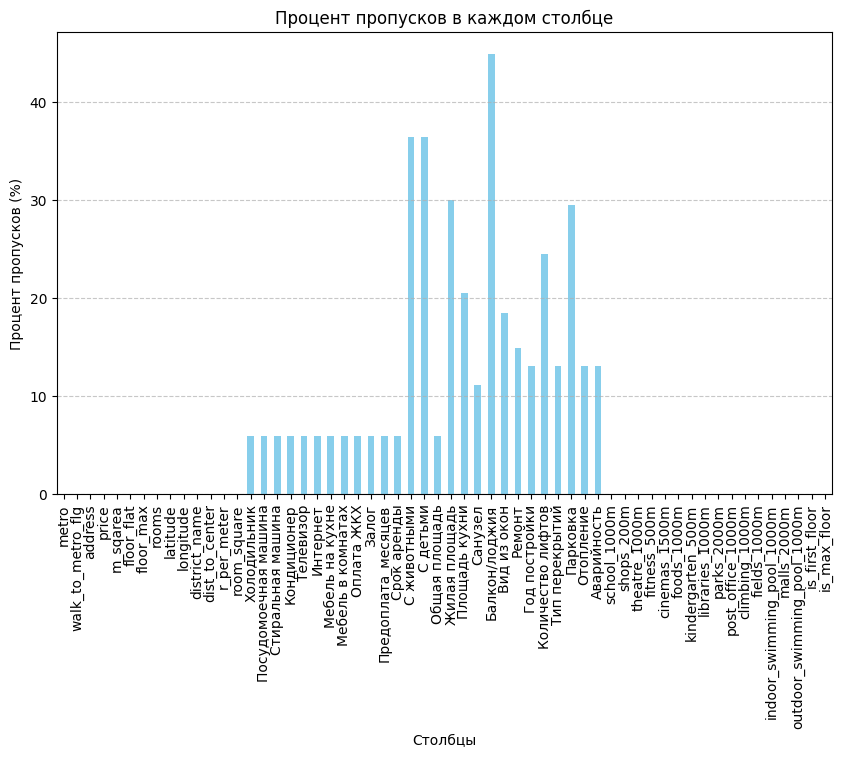

In [447]:
plt.figure(figsize=(10, 6))
missing_percent.plot(kind='bar', color='skyblue')
plt.title('Процент пропусков в каждом столбце')
plt.xlabel('Столбцы')
plt.ylabel('Процент пропусков (%)')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Всего 16060 строк , где 28 столбцов с пропусками от 6 до 45%

####2. **Удаляем полностью строки, в которых не заполнен пул данных из-за ошибки во время парсинга данных**

In [448]:
# Удалим строки, где пропущены значения в пуле столбцов. Для этого выберем столбец "Общая площадь"
df = df.dropna(subset=['Общая площадь'])

Удаляем полностью строки, в которых не заполнен пул данных в столбцах Общая площадь, Холодильник, Посудомоечная машина, Стиральная машина, Кондиционер, Телевизор, Интернет, Мебель на кухне, Мебель в комнатах, Оплата ЖКХ, Залог, Предоплата_месяцев, Срок аренды (не распарсились из-за ошибки на странице обявления).

Остается 15116 строк и 15 столбцов с пропусками

####3. **Обработка оставшихся 15 столбцов**

#### 3.1. **Столбец "Аварийность"**

In [449]:
# Уникальные значения для санузлов
df['Аварийность'].unique()

array([ 0., nan,  1.])

In [450]:
# Количество аварийных домов в данных
len(df.query('Аварийность == 1'))

1

В данных всего один аварийный дом. В связи с этим можем заменить пропуски в графе 'Аварийность' на 0.

In [451]:
# Заполним пропуски в столбце "аварийность" наиболее популярным признаком
df.loc[:, 'Аварийность'] = df['Аварийность'].fillna(0)

#### 3.2 **Количество лифтов**

In [452]:
# Уникальные значения для "Количество лифтов"
df['Количество лифтов'].unique()

array(['1 пассажирский', '1 пассажирский, 1 грузовой', nan,
       '2 пассажирских, 1 грузовой', '1 пассажирский, 2 грузовых',
       '2 пассажирских', '1 грузовой', '2 грузовых',
       '4 пассажирских, 2 грузовых', '4 грузовых', '4 пассажирских',
       '2 пассажирских, 2 грузовых', '3 пассажирских, 1 грузовой',
       '3 пассажирских', '3 пассажирских, 2 грузовых', '3 грузовых',
       '4 пассажирских, 1 грузовой', '3 пассажирских, 5 грузовых',
       '1 пассажирский, 3 грузовых', '3 пассажирских, 3 грузовых',
       '5 пассажирских, 2 грузовых', '4 пассажирских, 4 грузовых',
       '2 пассажирских, 3 грузовых', '5 пассажирских, 5 грузовых',
       '5 грузовых', '6 пассажирских, 3 грузовых', '10 пассажирских',
       '6 пассажирских, 1 грузовой', '9 пассажирских', '8 пассажирских',
       '2 пассажирских, 4 грузовых', '6 пассажирских',
       '8 пассажирских, 2 грузовых', '1 пассажирский, 4 грузовых',
       '4 пассажирских, 3 грузовых', '7 пассажирских, 1 грузовой',
       '5 пасса

In [453]:
# Заменим пропуски в "Количество лифтов" наиболее часто встречающимся для каждого типа этажности.
df.loc[:, 'Количество лифтов'] = df['Количество лифтов'].fillna(
    df.groupby('floor_max')['Количество лифтов'].transform(lambda x: x.mode()[0] if not x.mode().empty else "Не указано")
)

Вместо "Количество лифтов" создадим признак "сумма лифтов" и "грузовой лифт"

In [454]:
# Функция для подсчета общего количества лифтов
# (вычленение чисел из строк и их сложение)
def count_num(elevator_str):
    if pd.isna(elevator_str):
        return 0
    count = 0
    parts = elevator_str.split(', ')
    for part in parts:
        num = part.split()[0]
        if num.isdigit():
            count += int(num)
    return count

# Функция для определения наличия грузового лифта
def has_freight_elevator(elevator_str):
    if pd.isna(elevator_str):
        return False
    return 'грузовой' in elevator_str or 'грузовых' in elevator_str

# Применяем функции к столбцу
df['сумма_лифтов'] = df['Количество лифтов'].apply(count_num)
df['грузовой_лифт'] = df['Количество лифтов'].apply(has_freight_elevator)

#### 3.3 **Столбец "Санузел"**

In [455]:
# Уникальные значения для санузлов
df['Санузел'].unique()

array(['1 совмещенный', '1 раздельный', '1 совмещенный, 1 раздельный',
       nan, '2 совмещенных', '2 раздельных',
       '1 совмещенный, 2 раздельных', '3 раздельных', '3 совмещенных',
       '2 совмещенных, 2 раздельных', '3 совмещенных, 1 раздельный',
       '2 совмещенных, 1 раздельный', '4 совмещенных',
       '4 совмещенных, 4 раздельных', '3 совмещенных, 3 раздельных',
       '1 совмещенный, 3 раздельных'], dtype=object)

In [456]:
# Заменим пропуски в "Санузел" наиболее часто встречающимся для каждого типа комнатности.
df['Санузел'] = df['Санузел'].fillna(
    df.groupby('rooms')['Санузел'].transform(lambda x: x.mode()[0] if not x.mode().empty else "Не указано")
);

Вместо "Санузел" создадим признак "сумма санузлов" и "совмещенный"

In [457]:
# Функция для определения наличия раздельного санузла
def has_freight_toilet (str):
    if pd.isna(str):
        return False
    return 'совмещенный' in str or 'совмещенных' in str

# Применяем функции к столбцу
df['сумма_санузлов'] = df['Санузел'].apply(count_num)
df['совмещенный'] = df['Санузел'].apply(has_freight_toilet)

#### 3.4 **Столбец "district_name"**

In [458]:
# Уникальные значения для "district_name"
df['district_name'].unique()

array(['Восточный административный округ',
       'Троицкий административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ',
       'Северо-Восточный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Северный административный округ',
       'Новомосковский административный округ',
       'Северо-Западный административный округ',
       'Зеленоградский административный округ', nan], dtype=object)

In [459]:
df[df["district_name"].isna()]

,metro,walk_to_metro_flg,address,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,district_name,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Оплата ЖКХ,Залог,Предоплата_месяцев,Срок аренды,С животными,С детьми,Общая площадь,Жилая площадь,Площадь кухни,Санузел,Балкон/лоджия,Вид из окон,Ремонт,Год постройки,Количество лифтов,Тип перекрытий,Парковка,Отопление,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,is_first_floor,is_max_floor,сумма_лифтов,грузовой_лифт,сумма_санузлов,совмещенный
6880,Митино,True,"Москва, СЗАО, р-н Митино, м. Митино, Северо-За...",45000.0,39.0,11.0,25.0,1,55.833107,37.315397,NaN,20.0,1153.0,39.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,45000.0,1.0,от года,NaN,NaN,39.0,20.0,10.0,1 совмещенный,1 балкон,NaN,Евроремонт,2020.0,"1 пассажирский, 1 грузовой",Железобетонные,NaN,Центральное,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0,False,False,2,True,1,True
6937,Молжаниново,False,"Москва, САО, р-н Молжаниновский, м. Химки, Лен...",46000.0,34.0,8.0,14.0,1,55.898982,37.423303,NaN,20.0,1352.0,34.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,счетчики отдельно,46000.0,1.0,от года,False,True,34.0,NaN,10.0,1 совмещенный,1 балкон,На улицу,Евроремонт,NaN,"1 пассажирский, 1 грузовой",NaN,Наземная,NaN,0.0,0,0,0,0,0,0,0,0,10,0,0,0,0,14,0,False,False,2,True,1,True
9899,Планерная,False,"Москва, СЗАО, р-н Куркино, м. Химки, Куркинско...",100000.0,52.0,3.0,3.0,2,55.882772,37.425027,NaN,18.0,1923.0,26.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,включены в сумму,50000.0,1.0,несколько месяцев,False,True,52.0,42.0,6.0,1 совмещенный,NaN,На улицу и двор,Дизайнерский,NaN,1 пассажирский,NaN,ПарковкаНаземная,NaN,0.0,0,0,0,0,0,4,0,0,14,0,0,0,0,11,0,False,True,1,False,1,True


В данных только 3 пустых строчки. Заполним округ по аббревиатуре района в адресе

In [460]:
# Заполнение пропусков в столбце district_name
df.loc[(df['district_name'].isna()) & (df['address'].str.contains('ЮАО')), 'district_name'] = 'Южный административный округ'
df.loc[(df['district_name'].isna()) & (df['address'].str.contains('СЗАО')), 'district_name'] = 'Северо-Западный административный округ'
df.loc[(df['district_name'].isna()) & (df['address'].str.contains('САО')), 'district_name'] = 'Северный административный округ'

#### 3.5 **Столбец "Парковка"**

In [461]:
# Уникальные значения для "Парковка"
df['Парковка'].unique()

array(['ПарковкаНаземная', 'Наземная', nan, 'Многоуровневая',
       'ПарковкаПодземная', 'ПарковкаОткрытая', 'Подземная', 'Открытая',
       'ПарковкаМногоуровневая'], dtype=object)

In [462]:
# Заполним пропуски в столбце "Парковка" существующим признаком - Наземная
df['Парковка'] = df['Парковка'].fillna('Наземная');

In [463]:
# Заменим "ПарковкаНаземная" на "Наземная", "ПарковкаПодземная" на "Подземная", "ПарковкаОткрытая" на "Открытая"
df['Парковка'] = df['Парковка'].replace({'ПарковкаНаземная': 'Наземная', \
                                         'ПарковкаПодземная': 'Подземная', \
                                         'ПарковкаОткрытая': 'Наземная', \
                                         'ПарковкаМногоуровневая': 'Многоуровневая',
                                         'Открытая': 'Наземная',});

#### 3.6 **Столбец "Год постройки"**

In [464]:
# Уникальные значения для годов постройки
sorted_unique_values = sorted(df['Год постройки'].unique())
sorted_unique_values

[np.float64(1950.0),
 np.float64(1968.0),
 np.float64(nan),
 np.float64(1822.0),
 np.float64(1826.0),
 np.float64(1860.0),
 np.float64(1875.0),
 np.float64(1880.0),
 np.float64(1884.0),
 np.float64(1886.0),
 np.float64(1888.0),
 np.float64(1890.0),
 np.float64(1892.0),
 np.float64(1895.0),
 np.float64(1896.0),
 np.float64(1898.0),
 np.float64(1900.0),
 np.float64(1902.0),
 np.float64(1903.0),
 np.float64(1904.0),
 np.float64(1905.0),
 np.float64(1906.0),
 np.float64(1907.0),
 np.float64(1908.0),
 np.float64(1910.0),
 np.float64(1911.0),
 np.float64(1912.0),
 np.float64(1913.0),
 np.float64(1914.0),
 np.float64(1915.0),
 np.float64(1916.0),
 np.float64(1917.0),
 np.float64(1923.0),
 np.float64(1924.0),
 np.float64(1925.0),
 np.float64(1926.0),
 np.float64(1927.0),
 np.float64(1928.0),
 np.float64(1929.0),
 np.float64(1930.0),
 np.float64(1931.0),
 np.float64(1932.0),
 np.float64(1933.0),
 np.float64(1934.0),
 np.float64(1935.0),
 np.float64(1936.0),
 np.float64(1937.0),
 np.float64(1938

Удалим строку (она одна) с годом построки 2026 г, т.к. он еще не наступил

In [465]:
# Удалим строку (она одна) с годом построки 2026 г, т.к. он еще не наступил
df = df[df['Год постройки'] != 2026]

In [466]:
# Заполним пропуски в "Год_постройки" для каждого адреса
# (вставим в пустые строки год постройки по схожему адресу)
df["Год постройки"] = df.groupby("address")["Год постройки"] \
                        .transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'));

<ipython-input-466-bfcc1ead1767>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  .transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'));


In [467]:
# Заменим пропуски для "Год постройки" на наиболее часто встречающийся в этом районе
df['Год постройки'] = df['Год постройки'].fillna(
    df.groupby('district_name')['Год постройки'].transform(lambda x: x.mode()[0] if not x.mode().empty else "Не указано")
);

#### 3.7 **Столбцы "С животными" и "С детьми"**

In [468]:
# Уникальные значения для "С животными"
df['С животными'].unique()

array([False, nan, True], dtype=object)

In [469]:
# Уникальные значения для "С детьми"
df['С детьми'].unique()

array([True, nan, False], dtype=object)

In [470]:
# Заполним пропуски в столбце "С животными" новым признаком - По договоренности
df['С животными'] = df['С животными'].fillna('по договоренности');

# Заполним пропуски в столбце "С детьми" новым признаком - По договоренности
df['С детьми'] = df['С детьми'].fillna('по договоренности');

#### 3.8 **Столбец "Балкон/лоджия"**

In [471]:
# Уникальные значения для Балкон/лоджия
df['Балкон/лоджия'].unique()

array([nan, '1 балкон', '1 лоджия', '2 лоджии, 2 балкона',
       '1 лоджия, 1 балкон', '2 балкона', '3 балкона', '2 лоджии',
       '3 лоджии', '3 лоджии, 1 балкон', '1 лоджия, 3 балкона',
       '1 лоджия, 2 балкона', '2 лоджии, 1 балкон', '4 балкона'],
      dtype=object)

In [472]:
# Подсчет процента пропусков
missing_percentage = df['Балкон/лоджия'].isna().mean() * 100
print(f'Процент пропусков в столбце Балкон/лоджия: {missing_percentage:.2f}%')

Процент пропусков в столбце Балкон/лоджия: 41.39%


В этом столбце наблюдается максимальный процент пропусков. При этом отсутствует уникальное значение обозначающее отсутсвие балкона или лоджии. Заменим пропуски на значение "нет"

In [473]:
# обработаем пропуски в балконах/лоджиях, заменим их на
df['Балкон/лоджия'] = df['Балкон/лоджия'].fillna('нет');

Вместо "Балкон/лоджия" создадим признак "сумма балконов" (сумма балконов/лоджий) и "балкон" (наличие балкона/лоджии)

In [474]:
# Функция для определения наличия грузового лифта
def has_freight_balkon(str):
    if pd.isna(str):
        return False
    return 'балкон' in str or 'балкона' in str or 'лоджия' in str or 'лоджии' in str

# Применяем функции к столбцу
df['сумма_балконов'] = df['Балкон/лоджия'].apply(count_num)
df['балкон'] = df['Балкон/лоджия'].apply(has_freight_balkon)

#### 3.9 **Столбец "Отопление"**

In [475]:
# Уникальные значения для "Отопление"
df['Отопление'].unique()

array(['Центральное', nan, 'Индивидуальный тепловой пункт',
       'Нет информации', 'Автономная котельная',
       'Котел/Квартирное отопление', 'Электрическое', 'Нет', 'Печь'],
      dtype=object)

In [476]:
# Заполним пропуски в столбце "Отопление" существующим признаком - Нет информации
df['Отопление'] = df['Отопление'].fillna('Нет информации');

#### 3.10 **Столбец "Тип перекрытий"**

In [477]:
# Уникальные значения для типа перекрытий
df['Тип перекрытий'].unique()

array(['Железобетонные', nan, 'Деревянные', 'Нет информации', 'Смешанные'],
      dtype=object)

In [478]:
# Заполним пропуски в столбце "Тип перекрытий" существующим признаком - Нет информации
df['Тип перекрытий'] = df['Тип перекрытий'].fillna('Нет информации');

#### 3.11 **Столбец "post_office_1000m"**

In [479]:
# Уникальные значения для "post_office_1000m"
df['post_office_1000m'].unique()

array([0])

В столбце отсутвсуют значения

In [480]:
# Уникальные значения для вида из окон
df['Вид из окон'].unique()

array(['Во двор', 'На улицу', nan, 'На улицу и двор'], dtype=object)

#### 3.12 **Столбец "Ремонт"**

In [481]:
# Уникальные значения для "Ремонт"
df['Ремонт'].unique()

array(['Косметический', 'Евроремонт', 'Дизайнерский', 'Без ремонта', nan],
      dtype=object)

In [482]:
# Заменим пропуски для "Ремонт" на наиболее популярный "Евроремонт"
df['Ремонт'] = df['Ремонт'].fillna('Евроремонт');

#### 3.13 **Столбец "Площадь кухни"**

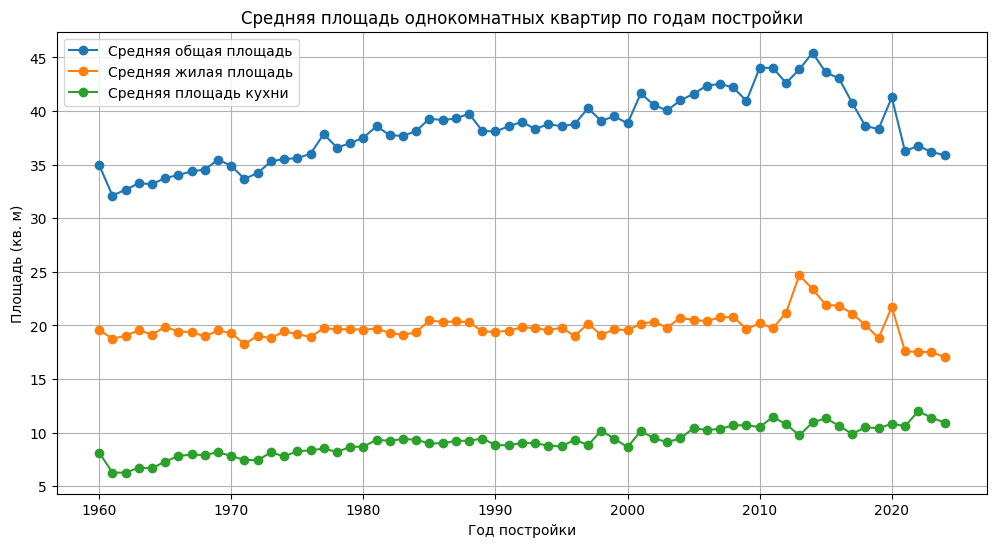

In [483]:
result = df.query('rooms == 1').groupby('Год постройки').agg({'Общая площадь': 'mean', 'Жилая площадь': 'mean', 'Площадь кухни': 'mean'}).reset_index()
result = result[result['Год постройки'].map(df.query('rooms == 1')['Год постройки'].value_counts()) >= 5]
result = result[result['Год постройки'] >= 1960]

plt.figure(figsize=(12, 6))
plt.plot(result['Год постройки'], result['Общая площадь'], marker='o', label='Средняя общая площадь')
plt.plot(result['Год постройки'], result['Жилая площадь'], marker='o', label='Средняя жилая площадь')
plt.plot(result['Год постройки'], result['Площадь кухни'], marker='o', label='Средняя площадь кухни')
plt.title('Средняя площадь однокомнатных квартир по годам постройки')
plt.xlabel('Год постройки')
plt.ylabel('Площадь (кв. м)')
plt.legend()
plt.grid()
plt.show()

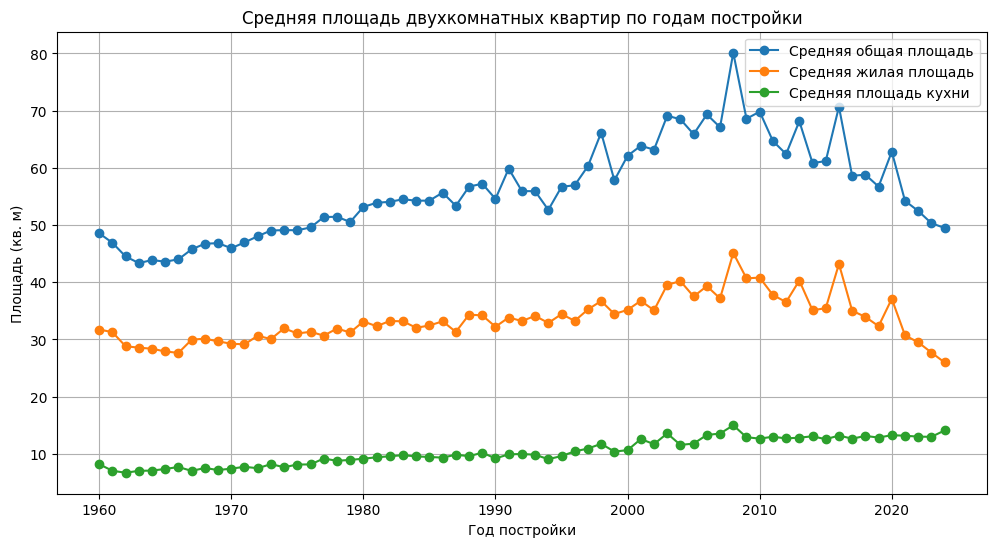

In [484]:
import matplotlib.pyplot as plt

result = df.query('rooms == 2').groupby('Год постройки').agg({'Общая площадь': 'mean', 'Жилая площадь': 'mean', 'Площадь кухни': 'mean'}).reset_index()
result = result[result['Год постройки'].map(df.query('rooms == 1')['Год постройки'].value_counts()) >= 5]
result = result[result['Год постройки'] >= 1960]

plt.figure(figsize=(12, 6))
plt.plot(result['Год постройки'], result['Общая площадь'], marker='o', label='Средняя общая площадь')
plt.plot(result['Год постройки'], result['Жилая площадь'], marker='o', label='Средняя жилая площадь')
plt.plot(result['Год постройки'], result['Площадь кухни'], marker='o', label='Средняя площадь кухни')
plt.title('Средняя площадь двухкомнатных квартир по годам постройки')
plt.xlabel('Год постройки')
plt.ylabel('Площадь (кв. м)')
plt.legend()
plt.grid()
plt.show()

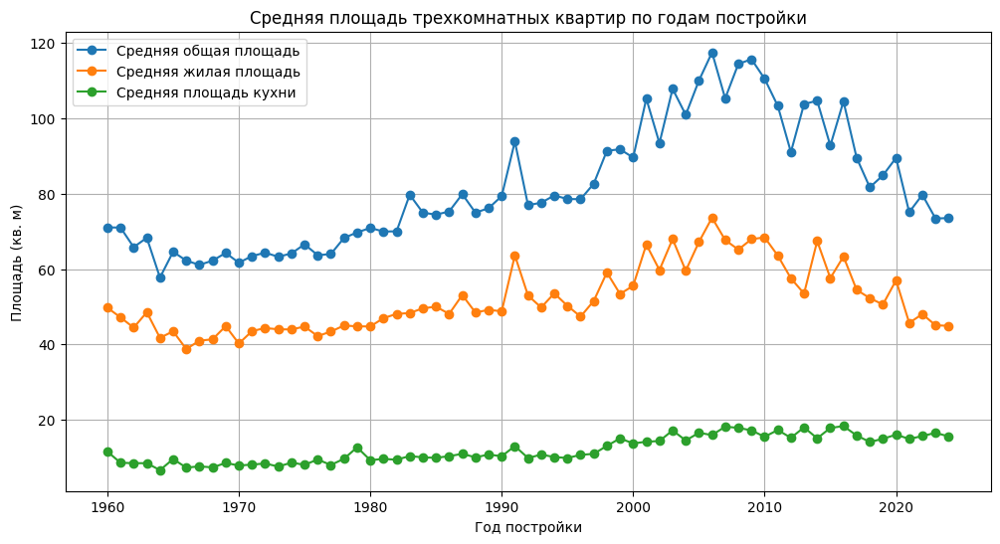

In [485]:
result = df.query('rooms == 3').groupby('Год постройки').agg({'Общая площадь': 'mean', 'Жилая площадь': 'mean', 'Площадь кухни': 'mean'}).reset_index()
result = result[result['Год постройки'].map(df.query('rooms == 1')['Год постройки'].value_counts()) >= 5]
result = result[result['Год постройки'] >= 1960]

plt.figure(figsize=(12, 6))
plt.plot(result['Год постройки'], result['Общая площадь'], marker='o', label='Средняя общая площадь')
plt.plot(result['Год постройки'], result['Жилая площадь'], marker='o', label='Средняя жилая площадь')
plt.plot(result['Год постройки'], result['Площадь кухни'], marker='o', label='Средняя площадь кухни')
plt.title('Средняя площадь трехкомнатных квартир по годам постройки')
plt.xlabel('Год постройки')
plt.ylabel('Площадь (кв. м)')
plt.legend()
plt.grid()
plt.show()

Можем наблюдать постепенный рост площади кухни с годами постройки, в то время как общая площадь квартир с 2010 г постепенно снижается

In [486]:
df['Доля площади кухни'] = df['Площадь кухни'] / df['Общая площадь']

In [487]:
# Заменяем пропуски в 'Доля площади кухни' на медианное значение по комнатности и году постройки
df['Доля площади кухни'] = df.groupby(['Год постройки', 'rooms'])['Доля площади кухни'].transform(np.median);

<ipython-input-487-7184c50a1969>:2: FutureWarning: The provided callable <function median at 0x7d22561676a0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  df['Доля площади кухни'] = df.groupby(['Год постройки', 'rooms'])['Доля площади кухни'].transform(np.median);


In [488]:
# Замена пропусков в столбце "Площадь кухни"
df['Площадь кухни'] = df['Площадь кухни'].fillna(df['Доля площади кухни'] * df['Общая площадь'])

In [489]:
empty_values = df[df['Площадь кухни'].isna()]
empty_values

,metro,walk_to_metro_flg,address,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,district_name,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Оплата ЖКХ,Залог,Предоплата_месяцев,Срок аренды,С животными,С детьми,Общая площадь,Жилая площадь,Площадь кухни,Санузел,Балкон/лоджия,Вид из окон,Ремонт,Год постройки,Количество лифтов,Тип перекрытий,Парковка,Отопление,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,is_first_floor,is_max_floor,сумма_лифтов,грузовой_лифт,сумма_санузлов,совмещенный,сумма_балконов,балкон,Доля площади кухни
1939,Библиотека им. Ленина,True,"Москва, ЦАО, р-н Пресненский, м. Библиотека им...",275000.0,91.0,2.0,8.0,3,55.757100,37.604744,Центральный административный округ,0.0,3021.0,30.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,счетчики отдельно,275000.0,1.0,от года,по договоренности,по договоренности,91.0,NaN,NaN,"1 совмещенный, 1 раздельный",нет,На улицу и двор,Евроремонт,1915.0,1 пассажирский,Железобетонные,Наземная,Центральное,0.0,22,3,16,0,13,532,1,2,69,0,0,0,0,29,0,False,False,1,False,2,True,0,False,NaN
1940,Библиотека им. Ленина,True,"Москва, ЦАО, р-н Пресненский, м. Библиотека им...",275000.0,91.0,2.0,8.0,3,55.757911,37.606137,Центральный административный округ,0.0,3021.0,30.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,счетчики отдельно,275000.0,1.0,от года,True,True,91.0,NaN,NaN,2 совмещенных,нет,Во двор,Дизайнерский,1915.0,1 пассажирский,Железобетонные,Наземная,Центральное,0.0,22,4,21,0,13,586,1,2,67,0,0,0,0,29,0,False,False,1,False,2,True,0,False,NaN
6797,Менделеевская,True,"Москва, ЦАО, р-н Тверской, м. Менделеевская, Н...",80000.0,30.0,3.0,4.0,1,55.787730,37.593740,Центральный административный округ,4.0,2666.0,30.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,75000.0,1.0,от года,True,True,30.0,NaN,NaN,1 раздельный,нет,Во двор,Дизайнерский,1888.0,1 пассажирский,Нет информации,Наземная,Центральное,0.0,21,2,5,2,3,370,5,2,25,0,0,0,0,12,0,False,False,1,False,1,False,0,False,NaN
8326,Новокузнецкая,True,"Москва, ЦАО, р-н Замоскворечье, м. Новокузнецк...",105000.0,43.0,5.0,6.0,2,55.745270,37.628568,Центральный административный округ,1.0,2441.0,21.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,счетчики отдельно,100000.0,1.0,несколько месяцев,False,True,43.0,NaN,NaN,1 совмещенный,нет,Во двор,Евроремонт,1903.0,1 пассажирский,Деревянные,Наземная,Центральное,0.0,9,5,0,0,9,220,2,1,56,0,0,0,0,27,0,False,False,1,False,1,True,0,False,NaN
10801,Проспект Вернадского,True,"Москва, ЮЗАО, р-н Ломоносовский, м. Проспект В...",195000.0,110.0,6.0,8.0,4,55.683112,37.521803,Юго-Западный административный округ,10.0,1772.0,27.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,счетчики отдельно,200000.0,1.0,от года,False,True,110.0,NaN,NaN,1 раздельный,1 балкон,На улицу и двор,Дизайнерский,1960.0,1 пассажирский,Железобетонные,Наземная,Центральное,0.0,31,1,1,0,2,51,2,0,15,0,0,0,1,15,0,False,False,1,False,1,False,1,True,NaN
13032,Театральная,True,"Москва, ЦАО, р-н Тверской, м. Театральная, ули...",95000.0,24.0,4.0,4.0,1,55.764121,37.615425,Центральный административный округ,1.0,3958.0,24.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,95000.0,1.0,от года,по договоренности,по договоренности,24.0,NaN,NaN,1 совмещенный,нет,Во двор,Дизайнерский,1892.0,1 пассажирский,Нет информации,Наземная,Центральное,0.0,16,2,20,2,11,765,2,1,63,0,0,0,0,24,0,False,True,1,False,1,True,0,False,NaN
15705,Щукинская,True,"Москва, СЗАО, р-н Щукино, м. Щукинская, улица ...",100000.0,38.0,5.0,5.0,1,55.805604,37.468470,Северо-Западный административный округ,11.0,2631.0,38.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,включены в сумму,100000.0,1.0,от года,по договоренности,по договоренности,38.0,NaN,NaN,1 совмещенный,нет,Во двор,Дизайнерский,1936.0,1 пассажирский,Железобетонные,Наземная,Центральное,0

In [490]:
df[['Доля площади кухни', 'Площадь кухни', 'Год постройки', 'rooms']].groupby(['Год постройки', 'rooms']).mean().head(50)

Доля площади кухни  Площадь кухни
Год постройки rooms                                   
1822.0        3                0.125000      10.000000
1826.0        2                0.222222      10.000000
1860.0        2                0.093132       8.000000
              3                0.287500      23.000000
1875.0        3                0.165877      14.000000
1880.0        2                0.187500      15.000000
              3                0.166667      13.000000
1884.0        2                0.191176      13.000000
1886.0        1                0.171429       6.000000
1888.0        1                     NaN            NaN
1890.0        2                0.148649      11.000000
              3                0.150000      11.250000
1892.0        1                     NaN            NaN
              2                0.144444      13.000000
              3                0.147368      12.894737
1895.0        1                0.250000      10.000000
1896.0        3                0.205607      22.000000
1898.0        3                0.174757      18.611650
1900.0        2                0.236364      12.636364
              3                0.158228      15.381329
1902.0        1                0.226190       8.000000
              2                0.185185      10.000000
              3                0.151102      14.400000
1903.0        2                     NaN            NaN
              3                0.175490      22.500000
1904.0        1                0.376344      14.000000
1905.0        2                0.210550      18.250000
              3                0.115033      10.179346
1906.0        2                0.129870      10.000000
              3                0.183673      18.000000
1907.0        3                0.103704      13.412346
1908.0        1                0.237545       6.700000
1910.0        1                0.469484      20.563380
              2                0.333333      25.000000
              3                0.127660      17.333333
1911.0        3                0.096154      16.666667
1912.0        1                0.177812      10.815603
1913.0        1                0.228798      11.000000
              2                0.183908       8.000000
              3                0.089667       7.300000
1914.0        1                0.192267       8.250000
              2                0.143197       8.621051
              3                0.104938      15.669753
1915.0        3                     NaN            NaN
1916.0        2                0.181818       8.000000
1917.0        1                0.271875       8.740000
              2                0.130435       7.333333
              3                0.150000      14.406250
1923.0        1                0.241071       9.000000
1924.0        2                0.125196       8.000000

В данных все еще наблюдается 7 пропусков. Это года постройки и комнатность, где не было данных по кухням. Заменим эти значения на среднее для данной комнатности.

In [491]:
# Заполняем пропуски средними значениями для каждой комнатности
df['Доля площади кухни'] = df.groupby('rooms')['Доля площади кухни'].transform(lambda x: x.fillna(x.mean()))

In [492]:
# Замена пропусков в столбце "Площадь кухни"
df['Площадь кухни'] = df['Площадь кухни'].fillna(df['Доля площади кухни'] * df['Общая площадь'])

#### 3.14 **Столбец "Жилая площадь"**

для жилой площади проделываем тоже самое, что и для площади кухонь.

In [493]:
df['Доля жилой площади'] = df['Жилая площадь'] / df['Общая площадь']

In [494]:
# Заменяем пропуски в 'Доля площади кухни' на медианное значение по комнатности и году постройки
df['Доля жилой площади'] = df.groupby(['Год постройки', 'rooms'])['Доля жилой площади'].transform(np.median);

<ipython-input-494-1a4fa02fcf1b>:2: FutureWarning: The provided callable <function median at 0x7d22561676a0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  df['Доля жилой площади'] = df.groupby(['Год постройки', 'rooms'])['Доля жилой площади'].transform(np.median);


In [495]:
# Замена пропусков в столбце "Площадь кухни"
df['Жилая площадь'] = df['Жилая площадь'].fillna(df['Доля жилой площади'] * df['Общая площадь'])

In [496]:
empty_values = df[df['Жилая площадь'].isna()]
len(empty_values)

10

In [497]:
df[['Доля жилой площади', 'Жилая площадь', 'Год постройки', 'rooms']].groupby(['Год постройки', 'rooms']).mean().head(50)

Доля жилой площади  Жилая площадь
Год постройки rooms                                   
1822.0        3                     NaN            NaN
1826.0        2                0.444444      20.000000
1860.0        2                0.597206      51.300000
              3                0.475000      38.000000
1875.0        3                0.533175      45.000000
1880.0        2                0.500000      40.000000
              3                0.410256      32.000000
1884.0        2                0.441176      30.000000
1886.0        1                0.742857      26.000000
1888.0        1                     NaN            NaN
1890.0        2                0.554054      41.000000
              3                0.714286      53.571429
1892.0        1                     NaN            NaN
              2                0.666667      60.000000
              3                0.778947      68.157895
1895.0        1                0.500000      20.000000
1896.0        3                0.579439      62.000000
1898.0        3                0.524272      55.834951
1900.0        2                0.591667      33.361667
              3                0.576923      56.432692
1902.0        1                0.407540      14.500000
              2                0.592593      32.000000
              3                0.594963      56.700000
1903.0        2                     NaN            NaN
              3                0.648431      70.500000
1904.0        1                0.537634      20.000000
1905.0        2                0.677083      54.000000
              3                0.776471      68.960588
1906.0        2                0.649351      50.000000
              3                0.612245      60.000000
1907.0        3                0.666667      86.222222
1908.0        1                0.496774      14.250000
1910.0        1                0.281690      12.338028
              2                0.533333      40.000000
              3                0.797872      75.531915
1911.0        3                0.685714     104.666667
1912.0        1                0.544833      34.712766
1913.0        1                0.528891      25.000000
              2                     NaN            NaN
              3                0.616667      55.000000
1914.0        1                0.478138      19.950000
              2                0.695029      39.646065
              3                0.617284      92.669136
1915.0        3                     NaN            NaN
1916.0        2                0.681818      30.000000
1917.0        1                0.562500      20.600000
              2                0.760000      35.333333
              3                0.650000      63.181250
1923.0        1                0.469643      17.500000
1924.0        2                0.672926      43.000000

В данных все еще наблюдается пропуски. Это года постройки и комнатность, где не было данных по жилой площади. Заменим эти значения на среднее для данной комнатности.

In [498]:
# Заполняем пропуски средними значениями для каждой комнатности
df['Доля жилой площади'] = df.groupby('rooms')['Доля жилой площади'].transform(lambda x: x.fillna(x.mean()))

In [499]:
# Замена пропусков в столбце "Площадь кухни"
df['Жилая площадь'] = df['Жилая площадь'].fillna(df['Доля жилой площади'] * df['Общая площадь'])

#### 3.15 **Столбец "metro"**

In [500]:
print('Столбец metro не содержим пропусков, но фактически tbd - отсутсвует')
print(f"{'metro'} - {df[df['metro']=='tbd']['metro'].count()}/{df.shape[0]}   - {round(df[df['metro']=='tbd']['metro'].count()/df.shape[0]*100,2)}% пропущено")
print('Большая часть находится в Троицом районе')
df[df['metro']=='tbd'].groupby('district_name').agg({'metro':'count'})

Столбец metro не содержим пропусков, но фактически tbd - отсутсвует
metro - 41/15115   - 0.27% пропущено
Большая часть находится в Троицом районе


,metro
district_name,
Восточный административный округ,1
Троицкий административный округ,40


**После удаления пропусков проверим данные на наличие пропусков**

In [501]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15115 entries, 0 to 16059
Data columns (total 66 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   metro                        15115 non-null  object 
 1   walk_to_metro_flg            15115 non-null  bool   
 2   address                      15115 non-null  object 
 3   price                        15115 non-null  float64
 4   m_sqarea                     15115 non-null  float64
 5   floor_flat                   15115 non-null  float64
 6   floor_max                    15115 non-null  float64
 7   rooms                        15115 non-null  int64  
 8   latitude                     15115 non-null  float64
 9   longitude                    15115 non-null  float64
 10  district_name                15115 non-null  object 
 11  dist_to_center               15115 non-null  float64
 12  r_per_meter                  15115 non-null  float64
 13  room_square          

**Выводы**

В столбце "Аварийность" только одно значение 1, таким образом, можно сделать вывод о том, что этот признак не может влиять на цену.

### 2. Выбросы

#### **Выбросы по общей площади квартир**

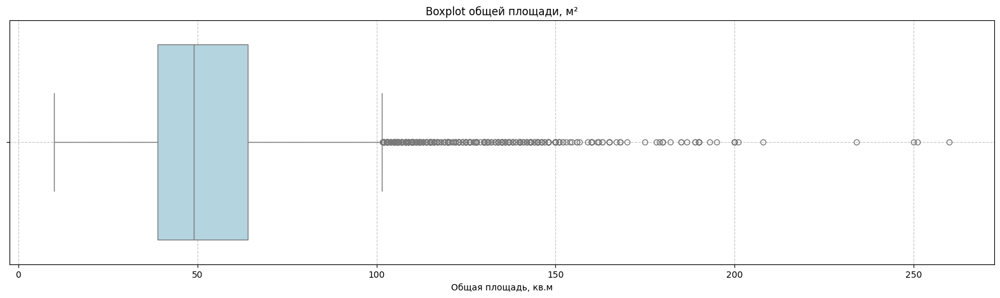

In [502]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df["Общая площадь"], color="lightblue")

plt.xlabel("Общая площадь, кв.м")
plt.title("Boxplot общей площади, м²")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

Исходное количество записей: 15115
Количество записей после удаления выбросов: 14494


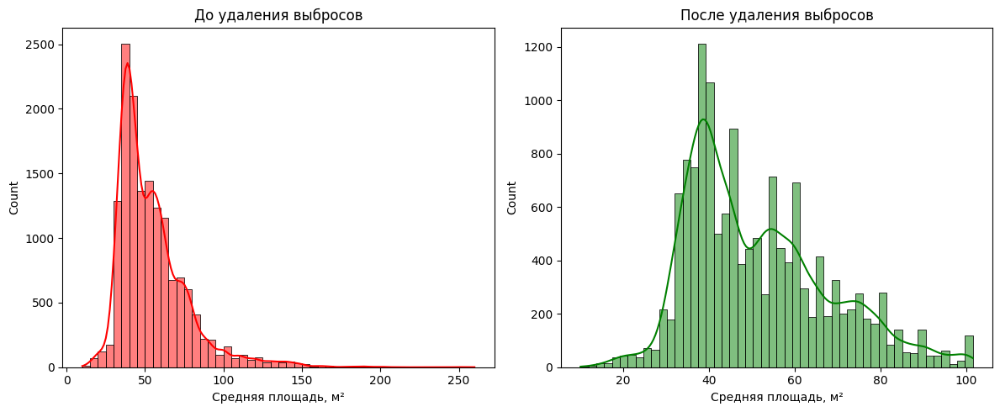

In [503]:
# Вычисляем IQR
Q1 = df["Общая площадь"].quantile(0.25)  # Первый квартиль (25%)
Q3 = df["Общая площадь"].quantile(0.75)  # Третий квартиль (75%)
IQR = Q3 - Q1  # Межквартильный размах

# Границы для выбросов
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Фильтруем данные без выбросов
df_square = df[(df["Общая площадь"] >= lower_bound) & (df["Общая площадь"] <= upper_bound)]

# Выводим до и после удаления выбросов
print(f"Исходное количество записей: {len(df)}")
print(f"Количество записей после удаления выбросов: {len(df_square)}")

# Строим гистограммы до и после
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(df["Общая площадь"], bins=50, kde=True, color="red", ax=axes[0])
axes[0].set_title("До удаления выбросов")
axes[0].set_xlabel("Средняя площадь, м²")

sns.histplot(df_square["m_sqarea"], bins=50, kde=True, color="green", ax=axes[1])
axes[1].set_title("После удаления выбросов")
axes[1].set_xlabel("Средняя площадь, м²")

plt.tight_layout()
plt.show()

#### **Выбросы по средней цене за кв.м**

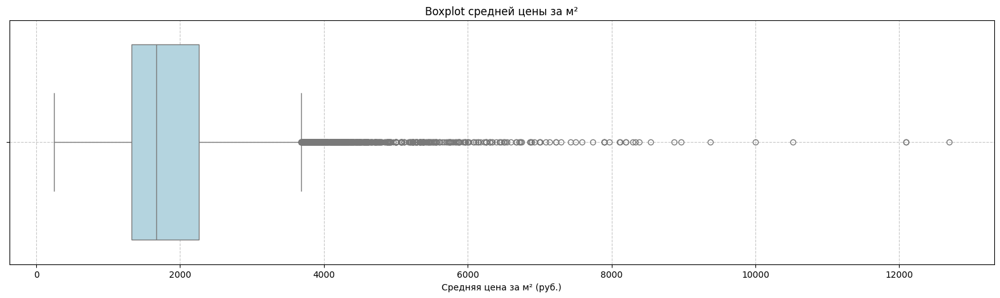

In [504]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df["r_per_meter"], color="lightblue")

plt.xlabel("Средняя цена за м² (руб.)")
plt.title("Boxplot средней цены за м²")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

В данных наблюдаются выбросы. Удалим выбросы и рассмотрим характер распределения цены за квадратный метр


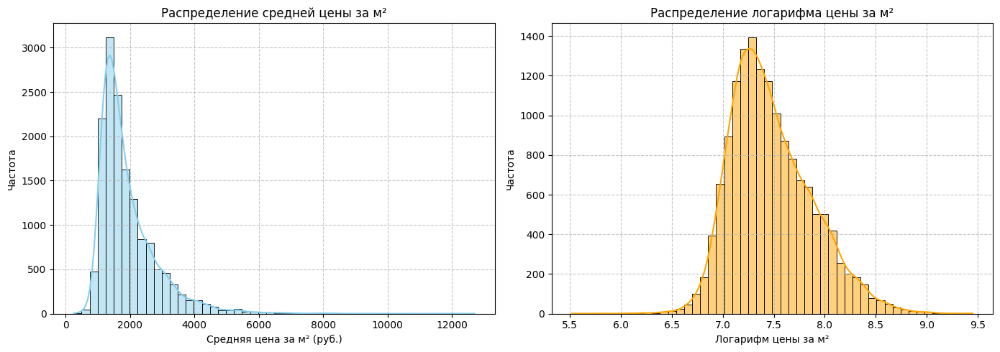

In [505]:
# Добавляем логарифм цены за м²
df["Лог(Цена за м²)"] = np.log(df["r_per_meter"])

# Создаем фигуру с 2 графиками
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Обычная гистограмма
sns.histplot(df["r_per_meter"], bins=50, kde=True, color="skyblue", ax=axes[0])
axes[0].set_xlabel("Средняя цена за м² (руб.)")
axes[0].set_ylabel("Частота")
axes[0].set_title("Распределение средней цены за м²")
axes[0].grid(True, linestyle="--", alpha=0.7)

# Гистограмма логарифма
sns.histplot(df["Лог(Цена за м²)"], bins=50, kde=True, color="orange", ax=axes[1])
axes[1].set_xlabel("Логарифм цены за м²")
axes[1].set_ylabel("Частота")
axes[1].set_title("Распределение логарифма цены за м²")
axes[1].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

<ipython-input-506-80d5922bc341>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_r = df_square[(df["r_per_meter"] >= lower_bound) & (df_square["r_per_meter"] <= upper_bound)]


Исходное количество записей: 14494
Количество записей после удаления выбросов: 13769


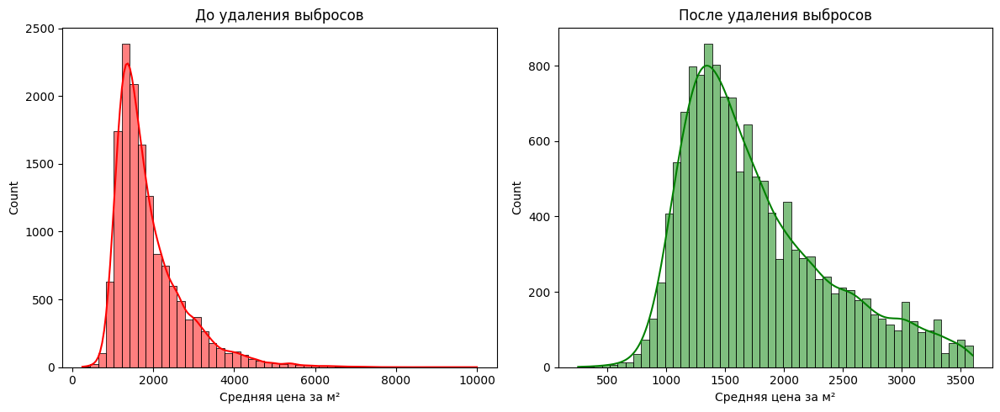

In [506]:
# Вычисляем IQR
Q1 = df_square["r_per_meter"].quantile(0.25)  # Первый квартиль (25%)
Q3 = df_square["r_per_meter"].quantile(0.75)  # Третий квартиль (75%)
IQR = Q3 - Q1  # Межквартильный размах

# Границы для выбросов
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Фильтруем данные без выбросов
df_r = df_square[(df["r_per_meter"] >= lower_bound) & (df_square["r_per_meter"] <= upper_bound)]

# Выводим до и после удаления выбросов
print(f"Исходное количество записей: {len(df_square)}")
print(f"Количество записей после удаления выбросов: {len(df_r)}")

# Строим гистограммы до и после
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(df_square["r_per_meter"], bins=50, kde=True, color="red", ax=axes[0])
axes[0].set_title("До удаления выбросов")
axes[0].set_xlabel("Средняя цена за м²")

sns.histplot(df_r["r_per_meter"], bins=50, kde=True, color="green", ax=axes[1])
axes[1].set_title("После удаления выбросов")
axes[1].set_xlabel("Средняя цена за м²")

plt.tight_layout()
plt.show()

#### **Выбросы по общей площади квартир**

Исходное количество записей: 13769
Количество записей после удаления выбросов: 13561


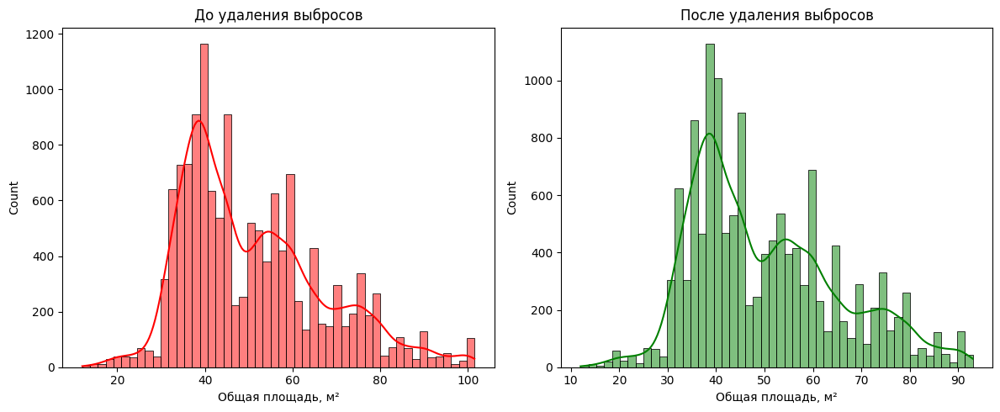

In [507]:
# Вычисляем IQR
Q1 = df_r["Общая площадь"].quantile(0.25)  # Первый квартиль (25%)
Q3 = df_r["Общая площадь"].quantile(0.75)  # Третий квартиль (75%)
IQR = Q3 - Q1  # Межквартильный размах

# Границы для выбросов
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Фильтруем данные без выбросов
df_rmp = df_r[(df_r["Общая площадь"] >= lower_bound) & (df_r["Общая площадь"] <= upper_bound)]

# Выводим до и после удаления выбросов
print(f"Исходное количество записей: {len(df_r)}")
print(f"Количество записей после удаления выбросов: {len(df_rmp)}")

# Строим гистограммы до и после
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(df_r["Общая площадь"], bins=50, kde=True, color="red", ax=axes[0])
axes[0].set_title("До удаления выбросов")
axes[0].set_xlabel("Общая площадь, м²")

sns.histplot(df_rmp["m_sqarea"], bins=50, kde=True, color="green", ax=axes[1])
axes[1].set_title("После удаления выбросов")
axes[1].set_xlabel("Общая площадь, м²")

plt.tight_layout()
plt.show()

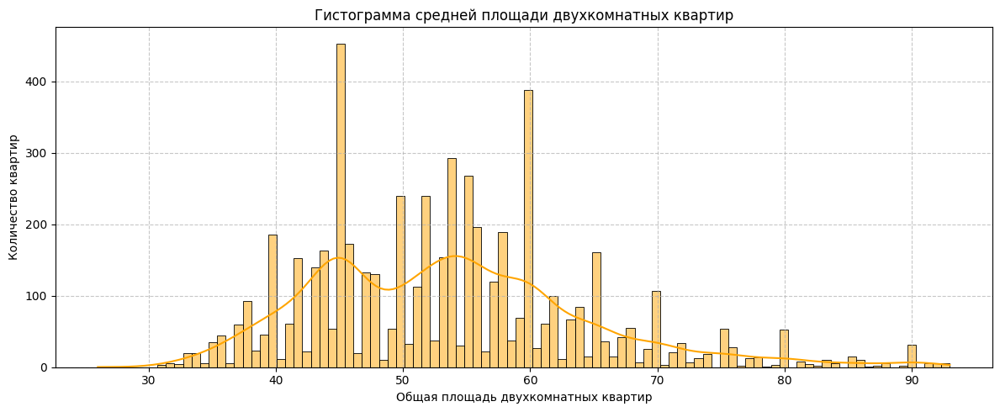

In [508]:

fig, axes = plt.subplots(figsize=(12, 5))

sns.histplot(df_rmp.query('rooms == 2')["m_sqarea"], bins=100, kde=True, color="orange")
axes.set_xlabel("Общая площадь двухкомнатных квартир")
axes.set_ylabel("Количество квартир")
axes.set_title("Гистограмма средней площади двухкомнатных квартир")
axes.grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

Волнообразная кривая средней цены за кв.м к площади может говорить о том, что к двухкомнатным квартирам также отнесены евродвушки, которые по сути являются однокомнатными квартирами с большой кухней. Такие же тенденции наблюдаются и в отношении трехкомнатных квартир/евротрехкомнатных и однокомнатных/студий

#### **Выбросы по площадям кухонь**

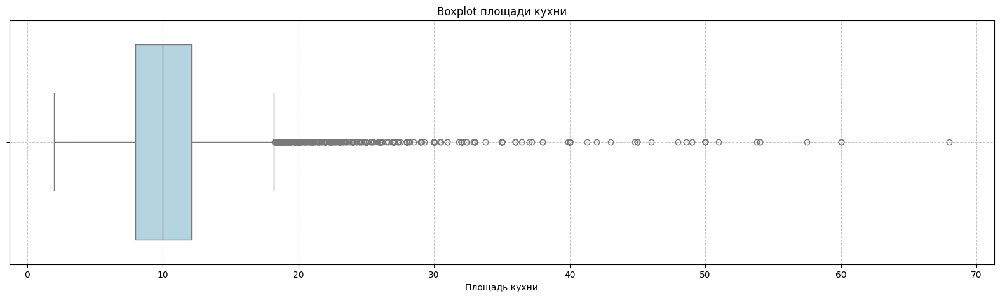

In [509]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df["Площадь кухни"], color="lightblue")

plt.xlabel("Площадь кухни")
plt.title("Boxplot площади кухни")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

Исходное количество записей: 13561
Количество записей после удаления выбросов: 12851


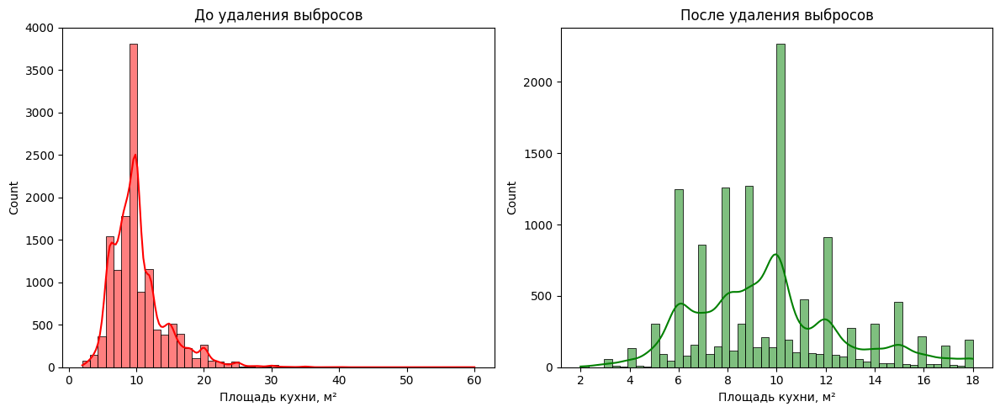

In [510]:
# Вычисляем IQR
Q1 = df_rmp["Площадь кухни"].quantile(0.25)  # Первый квартиль (25%)
Q3 = df_rmp["Площадь кухни"].quantile(0.75)  # Третий квартиль (75%)
IQR = Q3 - Q1  # Межквартильный размах

# Границы для выбросов
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Фильтруем данные без выбросов
df_clean = df_rmp[(df_rmp["Площадь кухни"] >= lower_bound) & (df_rmp["Площадь кухни"] <= upper_bound)]

# Выводим до и после удаления выбросов
print(f"Исходное количество записей: {len(df_rmp)}")
print(f"Количество записей после удаления выбросов: {len(df_clean)}")

# Строим гистограммы до и после
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(df_rmp["Площадь кухни"], bins=50, kde=True, color="red", ax=axes[0])
axes[0].set_title("До удаления выбросов")
axes[0].set_xlabel("Площадь кухни, м²")

sns.histplot(df_clean["Площадь кухни"], bins=50, kde=True, color="green", ax=axes[1])
axes[1].set_title("После удаления выбросов")
axes[1].set_xlabel("Площадь кухни, м²")

plt.tight_layout()
plt.show()

#### **Выбросы по паркам**

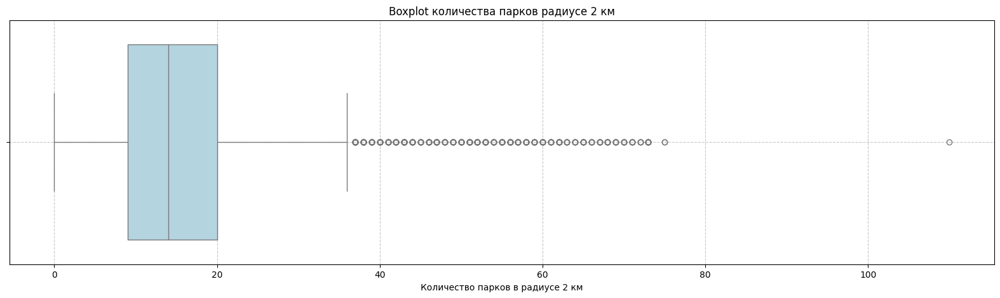

In [511]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df_clean["parks_2000m"], color="lightblue")

plt.xlabel("Количество парков в радиусе 2 км")
plt.title("Boxplot количества парков радиусе 2 км")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

Обратим внимание, что для количества парков наблюдаются выбросы, которых довольно много. Вместо количества парков укажем другой признак - "Наличие парка"

In [512]:
df_clean['park'] = df_clean['parks_2000m'] > 0

<ipython-input-512-89228bdf6672>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['park'] = df_clean['parks_2000m'] > 0


В столбцах

 'school_1000m',

 'shops_200m',

 'theatre_1000m',

 'fitness_500m',

 'cinemas_1500m',

 'foods_1000m',

 'kindergarten_500m',

 'libraries_1000m',

 'climbing_1000m',

 'fields_1000m',

 'indoor_swimming_pool_1000m',

 'malls_2000m',

 'outdoor_swimming_pool_1000m',  

 также наблюдаются выбросы. Чтобы не удалять значительное количество строк для каждого этого признака также можно создать дополнительный признак, определяющий наличие или отсутсвие объекта

In [513]:
df_clean['school'] = df_clean['school_1000m'] > 0
df_clean['shops'] = df_clean['shops_200m'] > 0
df_clean['theatre'] = df_clean['theatre_1000m'] > 0
df_clean['fitness'] = df_clean['fitness_500m'] > 0
df_clean['cinemas'] = df_clean['cinemas_1500m'] > 0
df_clean['foods'] = df_clean['foods_1000m'] > 0
df_clean['kindergarten'] = df_clean['kindergarten_500m'] > 0
df_clean['libraries'] = df_clean['libraries_1000m'] > 0
df_clean['climbing'] = df_clean['climbing_1000m'] > 0
df_clean['fields'] = df_clean['fields_1000m'] > 0
df_clean['outdoor_swimming_pool'] = df_clean['outdoor_swimming_pool_1000m'] > 0
df_clean['indoor_swimming_pool'] = df_clean['indoor_swimming_pool_1000m'] > 0
df_clean['malls'] = df_clean['malls_2000m'] > 0

<ipython-input-513-e3abb97db7f7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['school'] = df_clean['school_1000m'] > 0
<ipython-input-513-e3abb97db7f7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['shops'] = df_clean['shops_200m'] > 0
<ipython-input-513-e3abb97db7f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

#### **Выбросы по залогу**

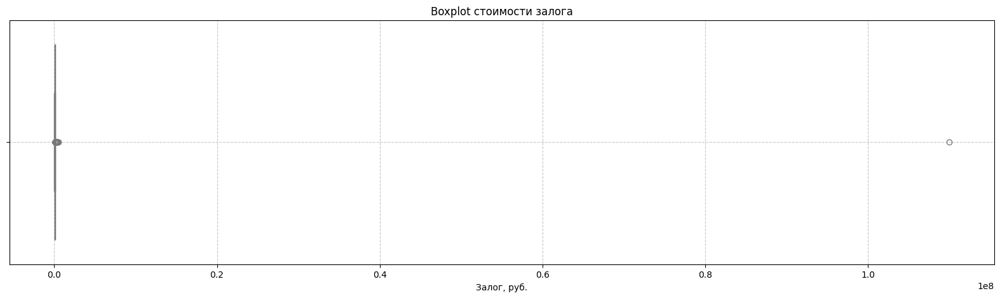

In [514]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df_clean["Залог"], color="lightblue")

plt.xlabel("Залог, руб.")
plt.title("Boxplot стоимости залога")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

Наблюдается яркий выброс в размере залога

In [515]:
df_clean.query('Залог > 1000000')

,metro,walk_to_metro_flg,address,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,district_name,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Оплата ЖКХ,Залог,Предоплата_месяцев,Срок аренды,С животными,С детьми,Общая площадь,Жилая площадь,Площадь кухни,Санузел,Балкон/лоджия,Вид из окон,Ремонт,Год постройки,Количество лифтов,Тип перекрытий,Парковка,Отопление,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,is_first_floor,is_max_floor,сумма_лифтов,грузовой_лифт,сумма_санузлов,совмещенный,сумма_балконов,балкон,Доля площади кухни,Доля жилой площади,park,school,shops,theatre,fitness,cinemas,foods,kindergarten,libraries,climbing,fields,outdoor_swimming_pool,indoor_swimming_pool,malls
15883,Юго-Западная,True,"Москва, ЗАО, р-н Тропарево-Никулино, м. Юго-За...",120000.0,72.0,5.0,27.0,2,55.663349,37.478738,Западный административный округ,13.0,1666.0,36.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,счетчики отдельно,110000000.0,1.0,от года,по договоренности,по договоренности,82.0,40.0,10.0,1 совмещенный,1 лоджия,Во двор,Евроремонт,2008.0,"2 пассажирских, 1 грузовой",Железобетонные,Подземная,Центральное,0.0,16,39,1,1,1,189,0,1,15,0,0,0,0,9,0,False,False,3,True,1,True,1,True,0.1849,0.581081,True,True,True,True,True,True,True,False,True,False,False,False,False,True


Некоторые выбросы выглядят как ошибка. Заменим их на более подходящие.

In [516]:
df_clean.loc[df['Залог'] > 1000000, 'Залог'] = 110000
#df_clean.loc[df['Залог'] == 512455.0, 'Залог'] = 62000
#df_clean.loc[df['Залог'] == 350000.0, 'Залог'] = 60000

In [517]:
# Заменим сумму залога в руб. на кол-во месяцев
df_clean['Залог'] = df_clean['Залог'] / df_clean['price']

<ipython-input-517-272af8e97f1b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Залог'] = df_clean['Залог'] / df_clean['price']


In [518]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12851 entries, 0 to 16059
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   metro                        12851 non-null  object 
 1   walk_to_metro_flg            12851 non-null  bool   
 2   address                      12851 non-null  object 
 3   price                        12851 non-null  float64
 4   m_sqarea                     12851 non-null  float64
 5   floor_flat                   12851 non-null  float64
 6   floor_max                    12851 non-null  float64
 7   rooms                        12851 non-null  int64  
 8   latitude                     12851 non-null  float64
 9   longitude                    12851 non-null  float64
 10  district_name                12851 non-null  object 
 11  dist_to_center               12851 non-null  float64
 12  r_per_meter                  12851 non-null  float64
 13  room_square          

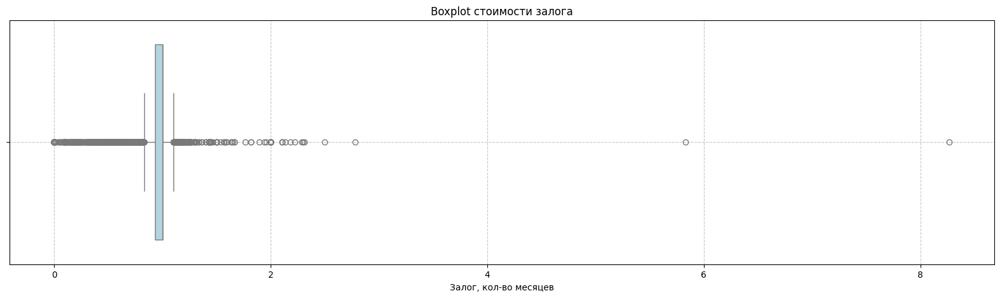

In [519]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df_clean["Залог"], color="lightblue")

plt.xlabel("Залог, кол-во месяцев")
plt.title("Boxplot стоимости залога")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

In [520]:
df_clean.loc[df_clean['Залог'] > 3.0, 'Залог'] = 3.0

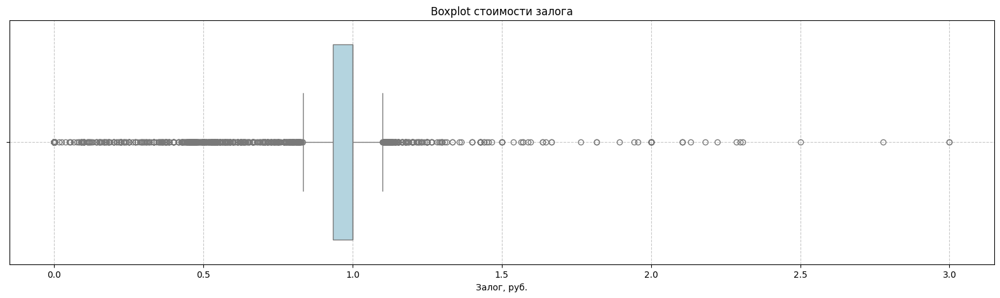

In [521]:
plt.figure(figsize=(20, 5))
sns.boxplot(x=df_clean["Залог"], color="lightblue")

plt.xlabel("Залог, руб.")
plt.title("Boxplot стоимости залога")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

### 3. Исследовательский анализ

#### **Основные статистики данных**

In [522]:
statistics = df_clean.describe()
statistics

,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Залог,Предоплата_месяцев,Общая площадь,Жилая площадь,Площадь кухни,Год постройки,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,сумма_лифтов,сумма_санузлов,сумма_балконов,Доля площади кухни,Доля жилой площади
count,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.0,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000,12851.000000
mean,84900.944284,49.484352,8.298187,16.008637,1.747802,55.728699,37.573653,12.299588,1743.547739,30.343320,0.887324,0.404482,0.946308,0.472337,0.666563,0.769823,0.831531,0.917283,0.900198,0.992296,49.500141,28.979914,9.633623,1994.542059,0.000078,14.788810,4.945919,0.582367,0.912225,1.569761,82.267372,2.001945,0.955645,15.900708,0.0,0.014707,0.053770,0.319975,8.810209,0.014085,2.143102,1.080538,0.693720,0.202338,0.568796
std,38854.239386,14.997207,6.383779,8.912947,0.717628,0.098751,0.139348,7.018589,607.747462,8.024414,0.316209,0.490811,0.225418,0.499254,0.471460,0.420962,0.374297,0.275465,0.272206,0.210287,15.007408,11.522053,3.008450,25.623463,0.008821,9.206777,5.869577,1.995434,1.994330,1.996148,78.503658,2.011928,0.942004,10.665152,0.0,0.120382,0.230014,0.712330,6.159969,0.117844,1.117941,0.282794,0.594821,0.048248,0.062332
min,18000.000000,12.000000,1.000000,1.000000,1.000000,55.215698,36.864371,0.000000,250.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,1.000000,2.000000,1822.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.089667,0.400000
25%,60000.000000,38.000000,4.000000,9.000000,1.000000,55.659853,37.485669,7.000000,1295.500000,24.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.933333,1.000000,38.000000,20.000000,7.507959,1971.000000,0.000000,8.000000,2.000000,0.000000,0.000000,0.000000,37.000000,0.000000,0.000000,9.000000,0.0,0.000000,0.000000,0.000000,5.000000,0.000000,1.000000,1.000000,0.000000,0.162175,0.508743
50%,75000.000000,45.000000,7.000000,15.000000,2.000000,55.730953,37.568938,11.000000,1578.000000,30.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,45.000000,28.000000,9.500000,2001.000000,0.000000,15.000000,3.000000,0.000000,0.000000,1.000000,60.000000,2.000000,1.000000,14.000000,0.0,0.000000,0.000000,0.000000,8.000000,0.000000,2.000000,1.000000,1.000000,0.210526,0.566352
75%,100000.000000,59.500000,11.000000,20.000000,2.000000,55.802462,37.667384,15.000000,2073.000000,37.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,59.500000,35.318384,11.000000,2020.000000,0.000000,21.000000,7.000000,0.000000,1.000000,2.000000,100.000000,3.000000,1.000000,20.000000,0.0,0.000000,0.000000,0.000000,13.000000,0.000000,3.000000,1.000000,1.000000,0.231861,0.613636
max,300000.000000,93.000000,64.000000,85.000000,3.000000,56.008123,37.949931,69.000000,3602.000000,80.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,4.000000,93.000000,85.000000,18.000000,2024.000000,1.000000,7

#### **Корреляционная матрица**

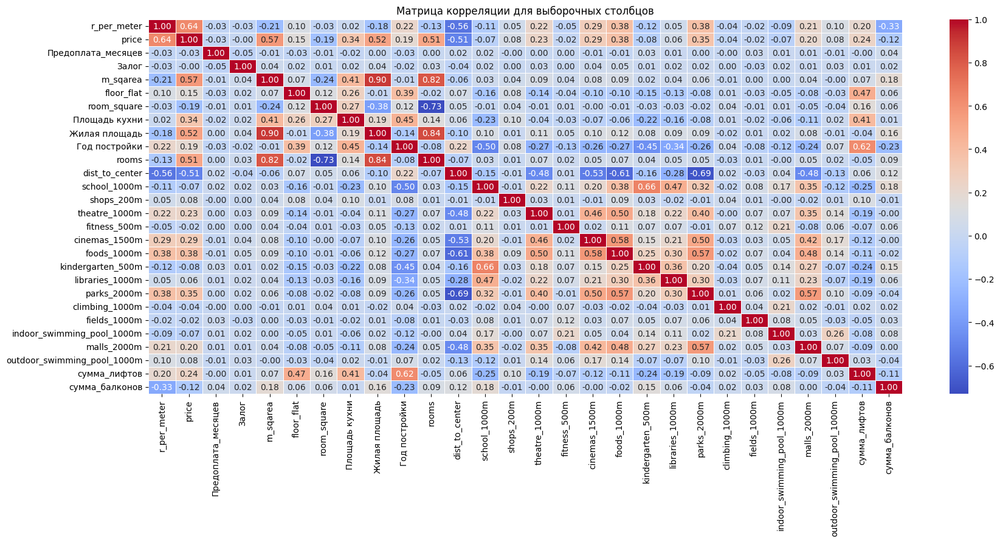

In [523]:
# Корреляционная матрица для числовых признаков
#selected_columns = ['price', 'm_sqarea','floor_flat', 'rooms', 'dist_to_center', 'r_per_meter',
#                    'room_square', 'Общая площадь', 'Жилая площадь', 'Площадь кухни', 'Год постройки',
#                    'school_1000m', 'shops_200m', 'theatre_1000m', 'fitness_500m', 'cinemas_1500m',
#                    'foods_1000m', 'kindergarten_500m', 'libraries_1000m', 'parks_2000m',
#                    'climbing_1000m', 'fields_1000m', 'indoor_swimming_pool_1000m',
#                    'malls_2000m', 'outdoor_swimming_pool_1000m']
selected_columns = ['r_per_meter', 'price', 'Предоплата_месяцев', 'Залог', 'm_sqarea','floor_flat',
                    'room_square', 'Площадь кухни', 'Жилая площадь', 'Год постройки', 'rooms', 'dist_to_center',
                    'school_1000m', 'shops_200m', 'theatre_1000m', 'fitness_500m', 'cinemas_1500m',
                    'foods_1000m', 'kindergarten_500m', 'libraries_1000m', 'parks_2000m',
                    'climbing_1000m', 'fields_1000m', 'indoor_swimming_pool_1000m',
                    'malls_2000m', 'outdoor_swimming_pool_1000m', 'сумма_лифтов', 'сумма_балконов']
df_selected = df_clean[selected_columns]
correlation_matrix = df_selected.corr(method='spearman')

# Визуализируем матрицу корреляции с помощью heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Матрица корреляции для выборочных столбцов")
plt.show()

In [524]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12851 entries, 0 to 16059
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   metro                        12851 non-null  object 
 1   walk_to_metro_flg            12851 non-null  bool   
 2   address                      12851 non-null  object 
 3   price                        12851 non-null  float64
 4   m_sqarea                     12851 non-null  float64
 5   floor_flat                   12851 non-null  float64
 6   floor_max                    12851 non-null  float64
 7   rooms                        12851 non-null  int64  
 8   latitude                     12851 non-null  float64
 9   longitude                    12851 non-null  float64
 10  district_name                12851 non-null  object 
 11  dist_to_center               12851 non-null  float64
 12  r_per_meter                  12851 non-null  float64
 13  room_square          

#### **Гистораммы по бинарным признакам**

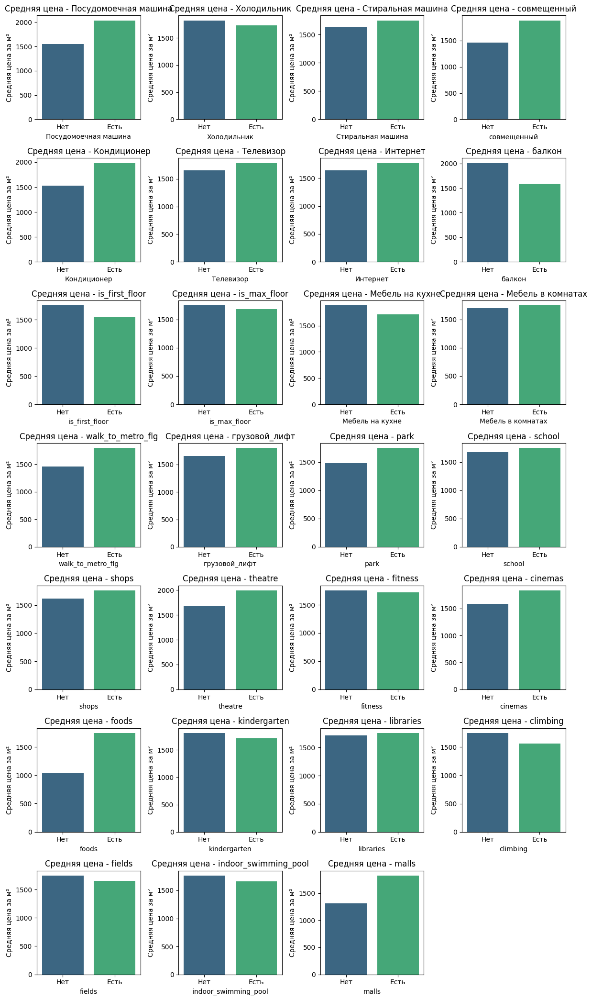

In [525]:
# Список категориальных признаков
features = ['Посудомоечная машина', 'Холодильник', 'Стиральная машина', 'совмещенный',
            'Кондиционер', 'Телевизор', 'Интернет', 'балкон',
            'is_first_floor', 'is_max_floor', 'Мебель на кухне', 'Мебель в комнатах',
            'walk_to_metro_flg', 'грузовой_лифт', 'park', 'school',
            'shops', 'theatre', 'fitness', 'cinemas',
            'foods', 'kindergarten', 'libraries', 'climbing',
            'fields', 'indoor_swimming_pool', 'malls']

# Настройка сетки графиков
num_features = len(features);
cols = 4  # Количество столбцов в сетке
rows = (num_features + cols - 1) // cols;  # Количество строк (округляем вверх)

fig, axes = plt.subplots(rows, cols, figsize=(12, rows * 3));

# Если только один ряд, axes может быть не массивом
axes = axes.flatten();

# Строим графики для каждого признака
for i, feature in enumerate(features):
    avg_price = df_clean.groupby(feature)['r_per_meter'].mean()
    sns.barplot(x=avg_price.index, y=avg_price.values, palette='viridis', ax=axes[i], hue=avg_price.index, legend=False)

    axes[i].set_xticks([0, 1])
    axes[i].set_xticklabels(['Нет', 'Есть'])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Средняя цена за м²')
    axes[i].set_title(f'Средняя цена - {feature}');

# Убираем лишние пустые графики (если признаков меньше, чем мест в сетке)
for i in range(len(features), len(axes)):
    fig.delaxes(axes[i]);

plt.tight_layout()  # Улучшает читаемость
plt.show()


**Наши предположения исходя из графиков:**

Цена для первых этажей ниже.

Пешеходная доступность до метро повышает ценник, наличие кондиционера и посудомоечной машины, наличие грузового лифта, парка  повышает ценник.

Отсутсвие балкона повышает цену, что странно. Должно быть замена пропусков для балконов на "нет" дает искажение. Возможно, стоит это признак удалить.

#### **Гистограммы по прочим категориальным признакам**

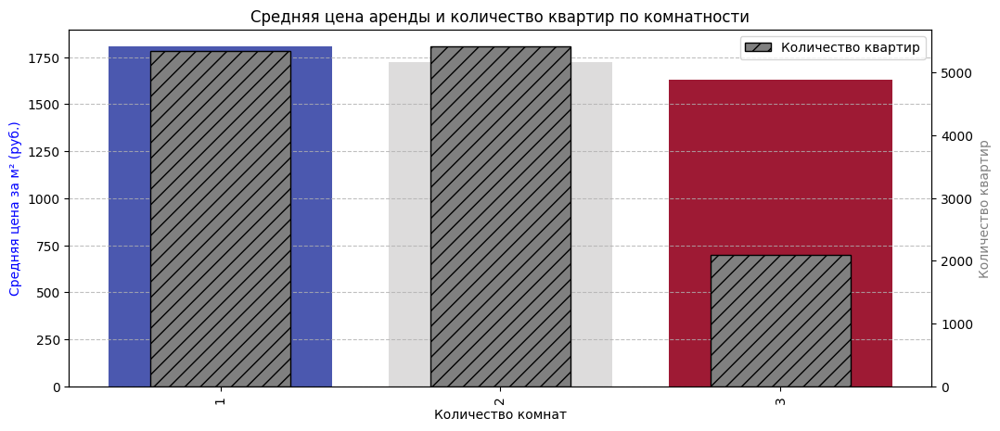

In [526]:
# Средняя цена за м² по количеству комнат
prices = df_clean.groupby("rooms")["r_per_meter"].mean().reset_index()

# Количество квартир по количеству комнат
counts = df_clean["rooms"].value_counts().sort_index().reset_index()
counts.columns = ['rooms', 'count']  # Переименуем колонки для удобства

# Убедимся, что оба DataFrame имеют одинаковый порядок комнат
prices = prices.sort_values(by="rooms")
counts = counts.sort_values(by="rooms")

# Создадим общий список комнат
unique_rooms = sorted(df_clean["rooms"].unique())

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="rooms",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1,
    order=unique_rooms  # Явно задаём порядок комнат
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Количество комнат")
ax1.set_title("Средняя цена аренды и количество квартир по комнатности")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()

# Используем индекс unique_rooms для позиционирования столбцов
x_positions = np.arange(len(unique_rooms))  # Позиции на оси X
bars = ax2.bar(
    x_positions,  # Используем числовые позиции
    counts.set_index("rooms").loc[unique_rooms, "count"],  # Данные в правильном порядке
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.5,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

# Устанавливаем подписи на оси X
ax1.set_xticks(x_positions)
ax1.set_xticklabels(unique_rooms, rotation=90)

# Легенда
ax2.legend(loc="upper right")

plt.show()

<ipython-input-527-0f1415f07738>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


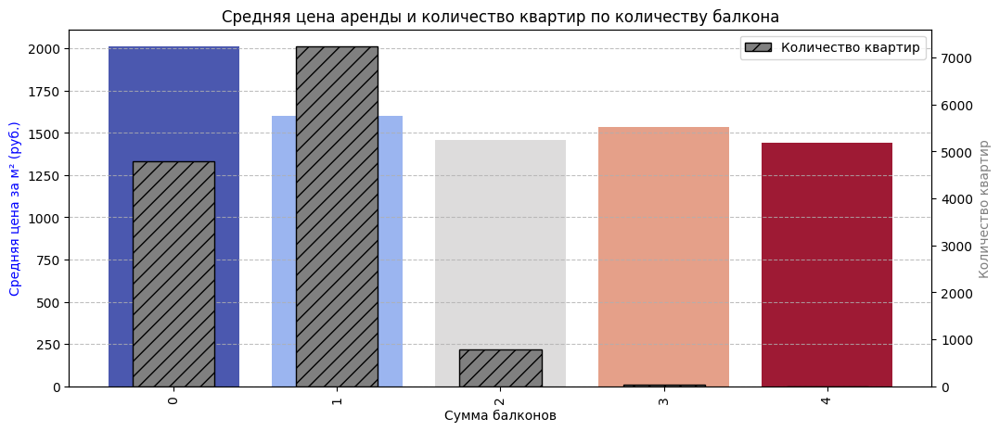

In [527]:
# Средняя цена за м² по типу балкона
prices = df_clean.groupby("сумма_балконов")["r_per_meter"].mean().reset_index()

# Количество квартир по типу балкона
balcony_counts = df_clean["сумма_балконов"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="сумма_балконов",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Сумма балконов")
ax1.set_title("Средняя цена аренды и количество квартир по количеству балкона")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    balcony_counts.index,
    balcony_counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.5,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=90)
plt.show()


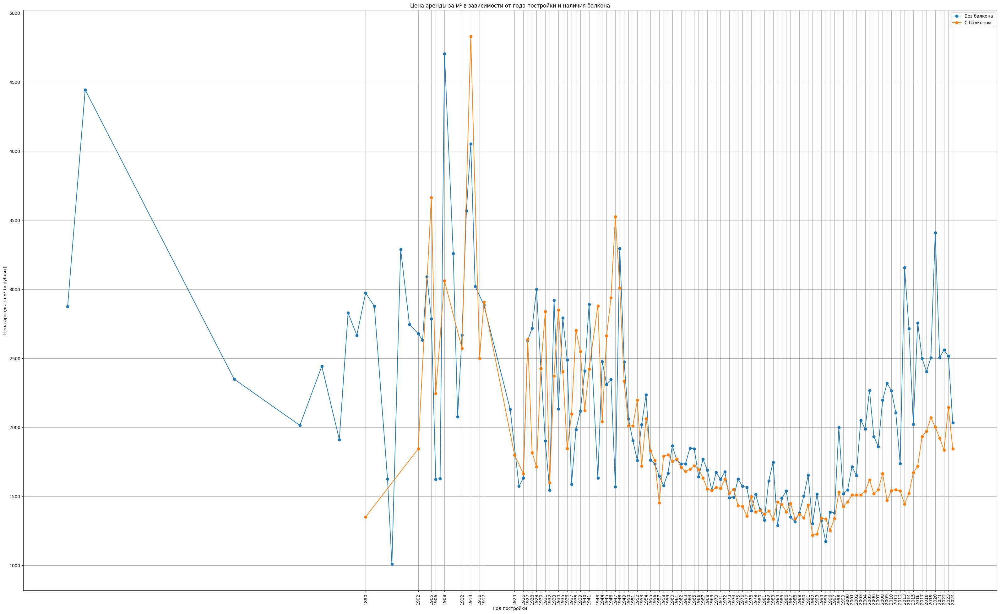

In [528]:
grouped = df.groupby(['Год постройки', 'балкон']).mean(numeric_only=True).reset_index()

plt.figure(figsize=(40, 24))

for has_balcony in grouped['балкон'].unique():
    subset = grouped[grouped['балкон'] == has_balcony]
    plt.plot(subset['Год постройки'], subset['r_per_meter'], marker='o', label='С балконом' if has_balcony else 'Без балкона')

plt.title('Цена аренды за м² в зависимости от года постройки и наличия балкона')
plt.xlabel('Год постройки')
plt.ylabel('Цена аренды за м² (в рублях)')
plt.xticks(subset['Год постройки'])
plt.legend()
plt.xticks(rotation=90)
plt.grid()
plt.show()

График показываетто, что количество квартир без балкона начиная с 1998 года растет и превышает количество квартир без балконов

<ipython-input-529-07199497ef46>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


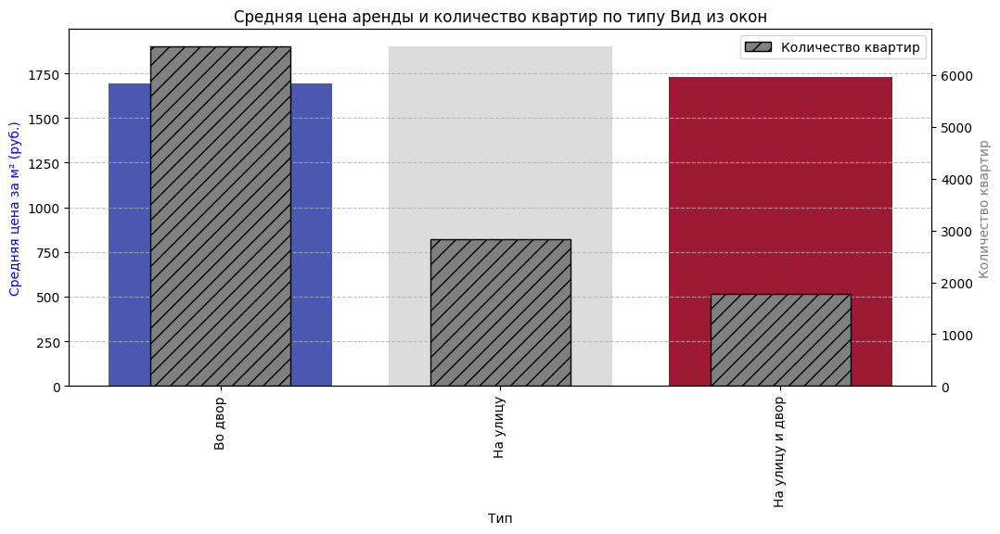

In [529]:
# Средняя цена за м² по типу
prices = df_clean.groupby("Вид из окон")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["Вид из окон"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="Вид из окон",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по типу Вид из окон")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.5,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

Столбец "Вид из окон" имеет пропуски, которые было не очевидно чем заменять. В связи с тем, что разница цены за кв.м не сильно отличается от типа вида из окон, то этот столбец можно исключить из рассмотрения.

<ipython-input-530-5b56698ede0c>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


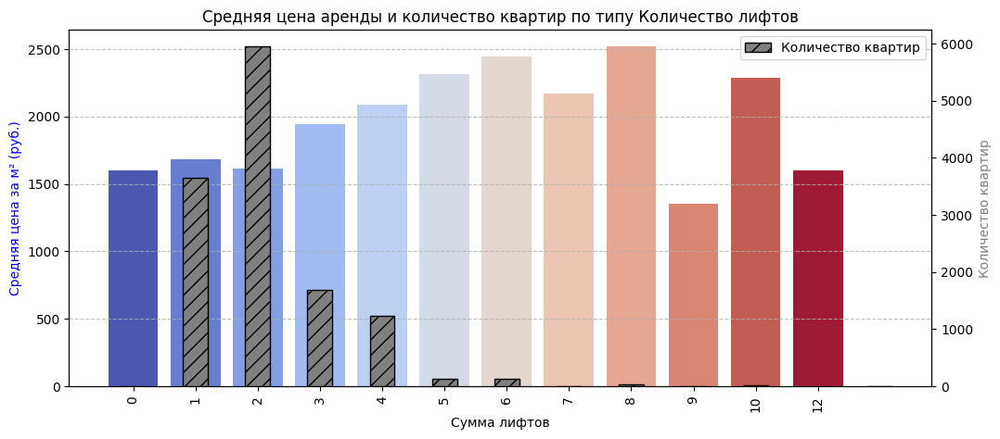

In [530]:
# Средняя цена за м² по типу
prices = df_clean.groupby("сумма_лифтов")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["сумма_лифтов"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="сумма_лифтов",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Сумма лифтов")
ax1.set_title("Средняя цена аренды и количество квартир по типу Количество лифтов")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

In [531]:
print('В категории "12 лифтов" всего', len(df_clean.query('сумма_лифтов == 12')), 'объект')
print('В категории "10 лифтов" всего', len(df_clean.query('сумма_лифтов == 10')), 'объектов')
print('В категории "9 лифтов" всего', len(df_clean.query('сумма_лифтов == 9')), 'объекта')
print('В категории "8 лифтов" всего', len(df_clean.query('сумма_лифтов == 8')), 'объектов')
print('В категории "7 лифтов" всего', len(df_clean.query('сумма_лифтов == 7')), 'объектов')
print('В категории "6 лифтов" всего', len(df_clean.query('сумма_лифтов == 6')), 'объекта')
print('В категории "5 лифтов" всего', len(df_clean.query('сумма_лифтов == 5')), 'объект')

В категории "12 лифтов" всего 1 объект
В категории "10 лифтов" всего 12 объектов
В категории "9 лифтов" всего 3 объекта
В категории "8 лифтов" всего 40 объектов
В категории "7 лифтов" всего 8 объектов
В категории "6 лифтов" всего 137 объекта
В категории "5 лифтов" всего 132 объект


Квартир с 12 лифтами только 1, она выглядит как ошибка, т.е. в доме скорее всего 1 или 2 лифта. Стоимость аренды в этом доме ближе к значению для 2 лифтов. Заменим признак 12 лифтов на 2 лифта.

In [532]:
df_clean['сумма_лифтов'] = df['сумма_лифтов'].replace(12, 2);

<ipython-input-532-8a14c0fa5862>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['сумма_лифтов'] = df['сумма_лифтов'].replace(12, 2);


In [533]:
pd.set_option('display.max_colwidth', None)

In [534]:
print(df_clean.query('сумма_лифтов == 9').address)

1021          Москва, САО, р-н Аэропорт, м. Красный Балтиец, Часовая улица, 18
14643    Москва, ЮАО, р-н Бирюлево Восточное, м. Царицыно, Михневская улица, 8
14647    Москва, ЮАО, р-н Бирюлево Восточное, м. Царицыно, Михневская улица, 8
Name: address, dtype: object


Пройдемся по 3 адресам, где количество лифтов 9, и вручную забьем количество лифтов, зная что это за дом.

По адресу Москва, ЮАО, р-н Бирюлево Восточное, м. Царицыно, Михневская улица, 8 действительно 9 лифтов в парадной, по адресу Москва, САО, р-н Аэропорт, м. Красный Балтиец, Часовая улица, 18 в парадной 3 лифта, исправим.

In [535]:
df.loc[df['address'] == 'Москва, САО, р-н Аэропорт, м. Красный Балтиец, ул. Верхняя Масловка, д. 10', 'сумма_лифтов'] = 3

Квартиры с 5, 6, 7, 8 и 10 лифтами стоят дорого. Введем вместо этого признака значение 5 лифтов и более.

In [536]:
df_clean.loc[df['сумма_лифтов'] >= 5, 'сумма_лифтов'] = '5 лифтов и более'

<ipython-input-536-ff22c015f7b0>:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5 лифтов и более' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_clean.loc[df['сумма_лифтов'] >= 5, 'сумма_лифтов'] = '5 лифтов и более'


In [537]:
# Преобразуем все значения в строки
df_clean['сумма_лифтов'] = df_clean['сумма_лифтов'].astype(str)

# Средняя цена за м² по типу
prices = df_clean.groupby("сумма_лифтов")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["сумма_лифтов"].value_counts().reset_index()
counts.columns = ["сумма_лифтов", "количество"]

<ipython-input-537-d121059f9aeb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['сумма_лифтов'] = df_clean['сумма_лифтов'].astype(str)


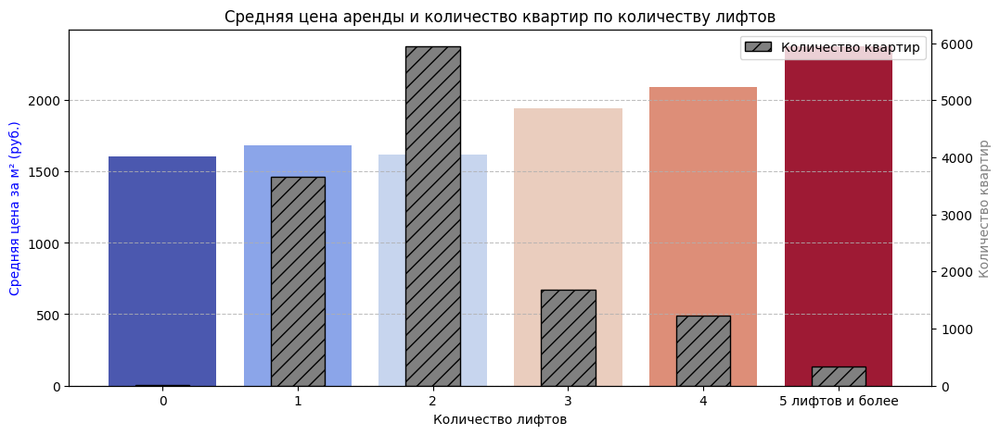

In [538]:
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="сумма_лифтов",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Количество лифтов")
ax1.set_title("Средняя цена аренды и количество квартир по количеству лифтов")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()

# Сортируем counts по порядку, чтобы столбцы отображались корректно
counts = counts.sort_values(by="сумма_лифтов")

# Создаем числовые позиции для оси X
x_positions = range(len(counts))

# Рисуем столбцы
bars = ax2.bar(
    x_positions,  # Используем числовые позиции
    counts["количество"],
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

# Настраиваем подписи на оси X
ax1.set_xticks(x_positions)
ax1.set_xticklabels(counts["сумма_лифтов"], rotation=0)

# Легенда
ax2.legend(loc="upper right")

plt.show()

<ipython-input-539-84abcf79b33e>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


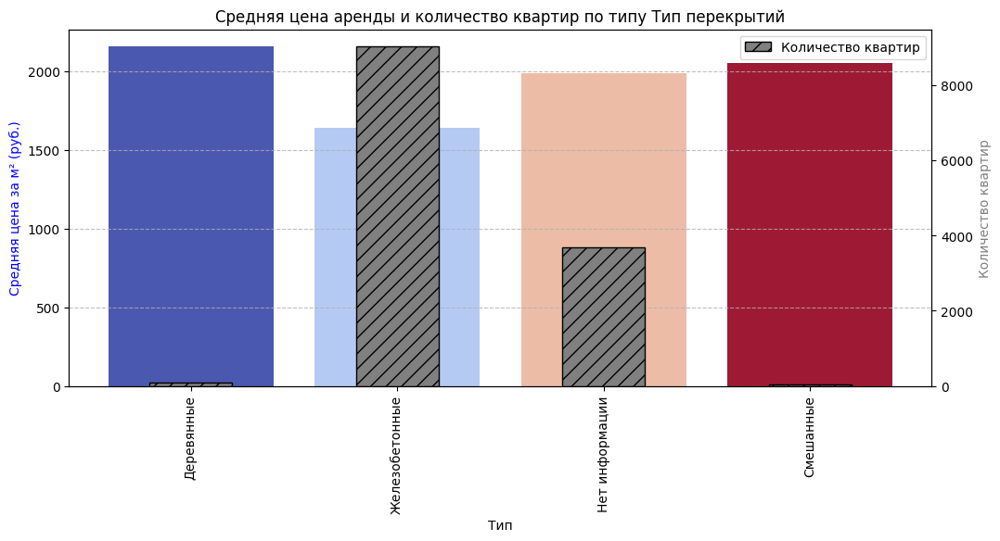

In [539]:
# Средняя цена за м² по типу
prices = df_clean.groupby("Тип перекрытий")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["Тип перекрытий"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="Тип перекрытий",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по типу Тип перекрытий")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

<ipython-input-540-16c1dee69ad1>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


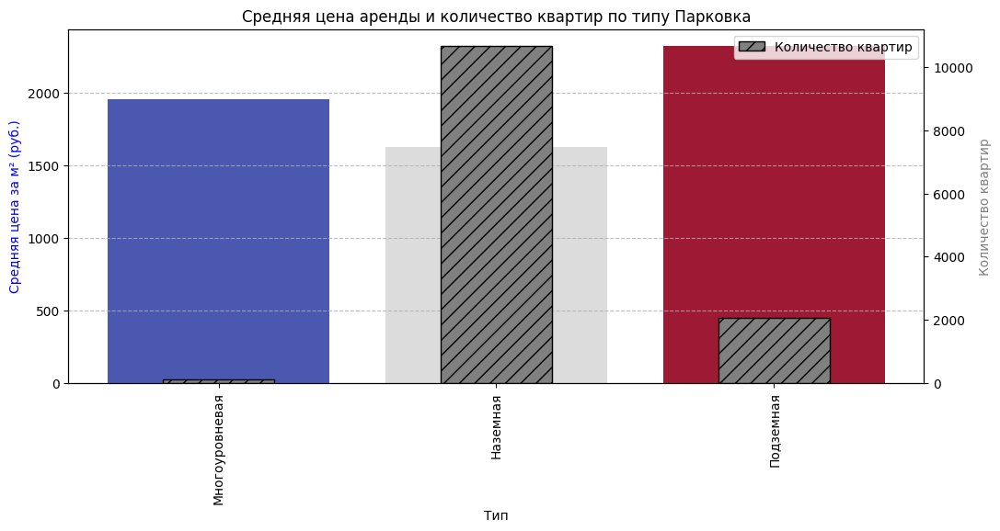

In [540]:
# Средняя цена за м² по типу
prices = df_clean.groupby("Парковка")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["Парковка"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="Парковка",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по типу Парковка")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

Наличие подземной парковки повышает цену.

<ipython-input-541-450ca4909f27>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


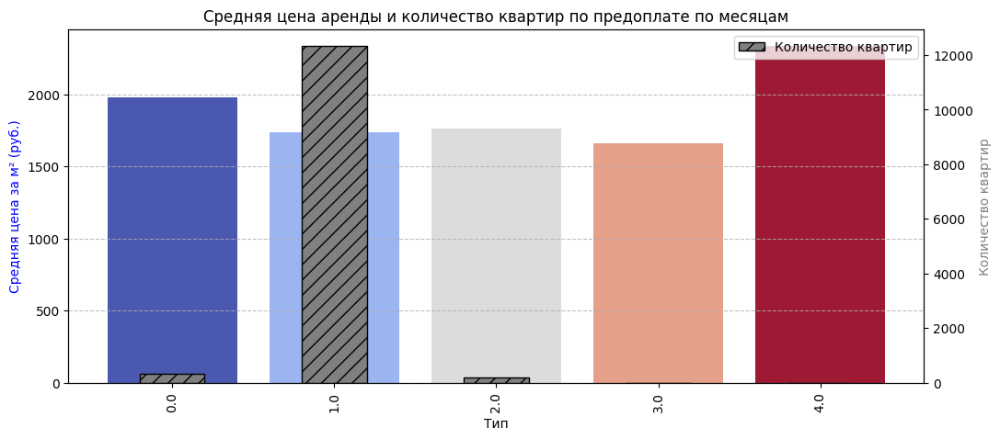

In [541]:
# Средняя цена за м² по типу
prices = df_clean.groupby("Предоплата_месяцев")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["Предоплата_месяцев"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="Предоплата_месяцев",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по предоплате по месяцам")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

<ipython-input-542-b08f4c0d4df9>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


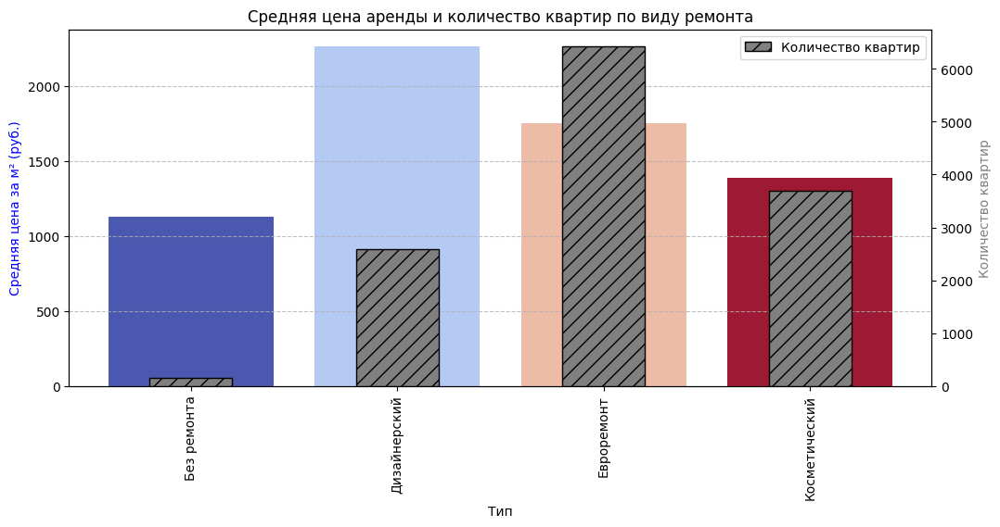

In [542]:
# Средняя цена за м² по типу
prices = df_clean.groupby("Ремонт")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["Ремонт"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="Ремонт",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по виду ремонта")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

Дизайнерский ремонт влияет на цену.

#### **Корреляция между площадью и ценой за кв.м**

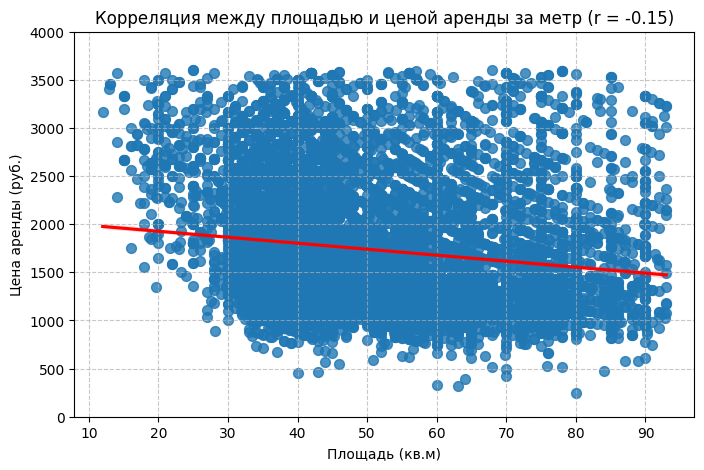

In [543]:
# Рассчитываем коэффициент корреляции
correlation = df_clean["r_per_meter"].corr(df["m_sqarea"])

# Строим диаграмму рассеяния с линейным трендом
plt.figure(figsize=(8, 5))
sns.regplot(x=df_clean["m_sqarea"], y=df_clean["r_per_meter"], scatter_kws={"s": 50}, line_kws={"color": "red"})

# Настройки графика
#plt.xlim(1900, 2025)
plt.ylim(0, 4000)
plt.xlabel("Площадь (кв.м)")
plt.ylabel("Цена аренды (руб.)")
plt.title(f"Корреляция между площадью и ценой аренды за метр (r = {correlation:.2f})")
plt.grid(True, linestyle="--", alpha=0.7)

# Отображение графика
plt.show()

На графике можем наблюдать низходящую корреляцию, т.е. чем больше площадь квартире, тем ниже цена аренды за кв.м

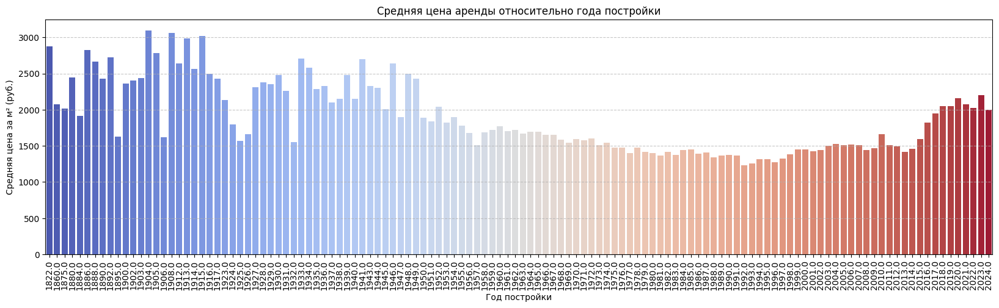

In [544]:
prices = df_clean.groupby("Год постройки")["r_per_meter"].mean().reset_index()

# Строим график
plt.figure(figsize=(20, 5))
sns.barplot(x="Год постройки", y="r_per_meter", data=prices, palette="coolwarm", hue=prices.index, legend=False)
plt.xticks(rotation=90)  # Поворот подписей станций
plt.xlabel("Год постройки")
plt.ylabel("Средняя цена за м² (руб.)")
plt.title("Средняя цена аренды относительно года постройки")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

Обратим внимание на то, что самые дорогие квартиры расположены в домах, построенных ранее 1955 г. Скорее это говорит о том, что данные квартиры расположены в центральной части города.

Далее скачек цен на квартиры наблюдается для домов, построенных в 2016 году и позднее.

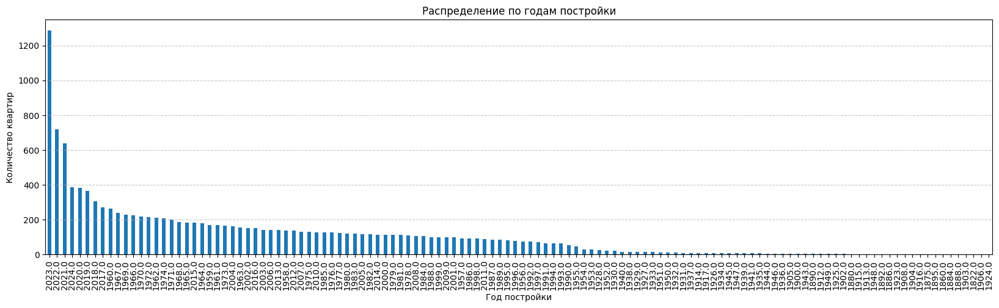

In [545]:
# Подсчет количества каждого типа
balcony_counts = df_clean["Год постройки"].value_counts()

# Построение гистограммы
plt.figure(figsize=(20, 5))
balcony_counts.plot(kind="bar")
plt.xlabel("Год постройки")
plt.ylabel("Количество квартир")
plt.title("Распределение по годам постройки")
plt.xticks(rotation=90)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Отображение графика
plt.show()

Обратим внимание, что количество предложений о сдаче квартир в домах начиная с 2017 года постройки и позже гораздо выше. Самое большое количество предложений наблюдается в домах построеных начниая с 2021 года.

#### **Сравнение показателей средней цены за кв.м по районам**

<ipython-input-546-dfb620e7e67f>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


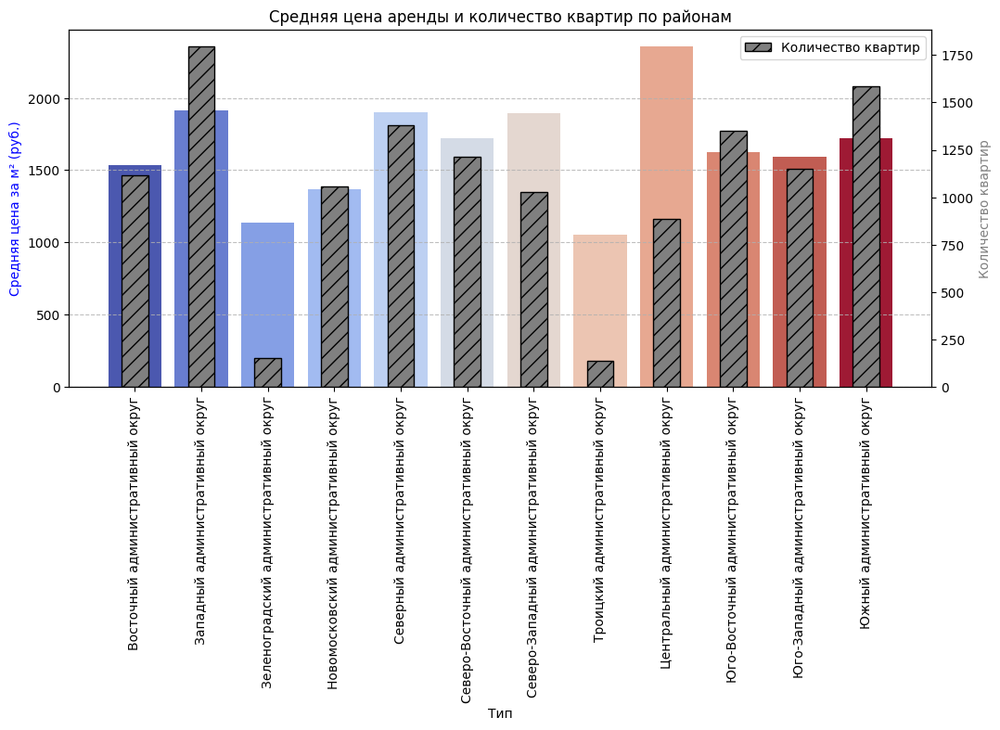

In [546]:
# Средняя цена за м² по типу
prices = df_clean.groupby("district_name")["r_per_meter"].mean().reset_index()

# Количество квартир по типу
counts = df_clean["district_name"].value_counts()

# Построение графика
fig, ax1 = plt.subplots(figsize=(12, 5))

# График 1: Средняя цена (барплот)
sns.barplot(
    x="district_name",
    y="r_per_meter",
    data=prices,
    hue=prices.index,
    legend=False,
    palette="coolwarm",
    ax=ax1
)
ax1.set_ylabel("Средняя цена за м² (руб.)", color="blue")
ax1.set_xlabel("Тип")
ax1.set_title("Средняя цена аренды и количество квартир по районам")
ax1.grid(axis="y", linestyle="--", alpha=0.8)

# График 2: Количество квартир (штрихованные столбцы) на вторую ось Y
ax2 = ax1.twinx()
bars = ax2.bar(
    counts.index,
    counts.values,
    alpha=1,
    color="gray",
    edgecolor="black",   # Черный контур
    hatch="//",          # Штриховка
    width=0.4,           # Регулировка ширины
    label="Количество квартир"
)
ax2.set_ylabel("Количество квартир", color="gray")

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Легенда
ax2.legend(loc="upper right")

#plt.xticks(rotation=0)
plt.show()

В Центральном округе цены заметно выше. Самое большое количество предложений представлено в Западном округе.


<ipython-input-547-9c45eec5db7c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


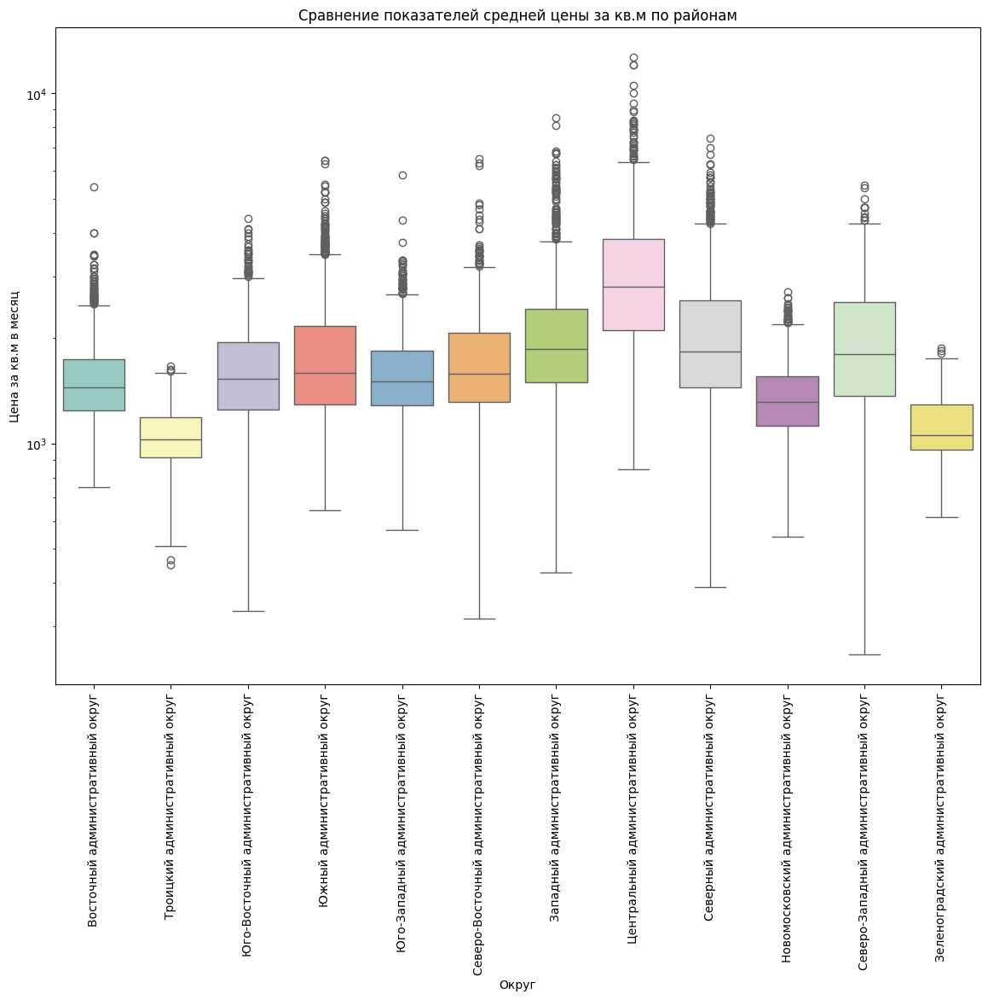

In [547]:
#подтверждаем, что по Москве в среднем, по медиане данные выше
plt.figure(figsize=(14, 10))
sns.boxplot(
    x="district_name",  # категориальная переменная
    y="r_per_meter",  # числовая переменная
    data=df,
    palette="Set3"
)
plt.xticks(rotation=90)
plt.yscale('log')
plt.xlabel("Округ")
plt.ylabel("Цена за кв.м в месяц")
plt.title("Сравнение показателей средней цены за кв.м по районам")
plt.show()

Центральный округ наиболее дорогой.

Бюджетные предложения по аренде квартир можно найти в Троицком и Зеленоградском округах.

<ipython-input-548-3962b5ad64df>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['distance_rounded'] = np.round(df_clean['dist_to_center']);


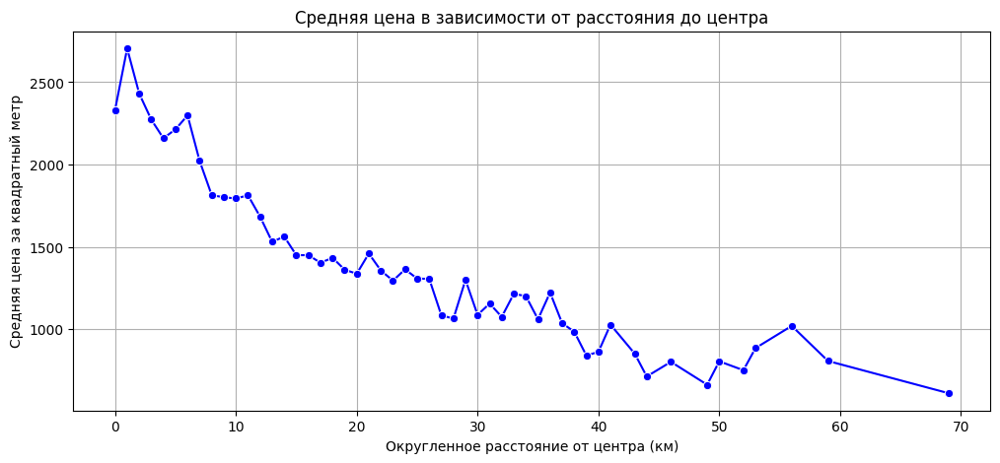

In [548]:
# Округляем расстояние до 1 км
df_clean['distance_rounded'] = np.round(df_clean['dist_to_center']);

# Группируем по округленному расстоянию и считаем среднюю цену
grouped = df_clean.groupby('distance_rounded')['r_per_meter'].mean().reset_index();

# Построение линейного графика
plt.figure(figsize=(12, 5));
sns.lineplot(x=grouped['distance_rounded'], y=grouped['r_per_meter'], marker='o', color='blue');

# Настройки графика
plt.xlabel('Округленное расстояние от центра (км)');
plt.ylabel('Средняя цена за квадратный метр');
plt.title('Средняя цена в зависимости от расстояния до центра');
plt.grid(True);

plt.show()

При удалении от центра цена за кв.м снижается. Наблюдается скачек цен на удалении 55 км от центра, что связано, скорее всего, с новостройками на окраинах и соотеветсвенно годом постройки домов, где цена за аренду, как правило, выше

####**Тепловая карта цен на аренду квартир**

In [ ]:
import mcfg #в файле лежат функции pg1,pg2 для подключения к postgresql

#сложность с округлением lat в том, что при просто круглении до сотых получаются прямоугольники
dfm = pd.read_sql('''
with cte as (
select
   (floor(latitude*100) +
   case when latitude*100 - floor(latitude*100) <0.25 then 0
   when latitude*100 - floor(latitude*100) <=0.75 then 0.5
   when latitude*100 - floor(latitude*100) >0.75 then 1 end)/100 grid_lat,
   round(longitude::numeric,2) grid_lon,
   avg(r_per_meter) r_per_meter,
   avg(dist_to_center) dist_to_center
from
	team18.dataset_table
group by
   (floor(latitude*100) +
   case when latitude*100 - floor(latitude*100) <0.25 then 0
   when latitude*100 - floor(latitude*100) <=0.75 then 0.5
   when latitude*100 - floor(latitude*100) >0.75 then 1 end)/100,
   round(longitude::numeric,2))

select
'[['||
'['||text(round(   (grid_lat::numeric-0.0025)::numeric    ,3)) ||', ' || text(round(   (grid_lon::numeric-0.005)::numeric    ,3))||'], '
'['||text(round(   (grid_lat::numeric+0.0025)::numeric    ,3)) ||', ' || text(round(   (grid_lon::numeric-0.005)::numeric    ,3))||'], '
'['||text(round(   (grid_lat::numeric+0.0025)::numeric    ,3)) ||', ' || text(round(   (grid_lon::numeric+0.005)::numeric    ,3))||'], '
'['||text(round(   (grid_lat::numeric-0.0025)::numeric    ,3)) ||', ' || text(round(   (grid_lon::numeric+0.005)::numeric    ,3))||']'
||']]' as square,
grid_lat,
grid_lon,
r_per_meter,
dist_to_center,
ntile(15) over(order by r_per_meter) color_map
from cte
    ''',con=mcfg.pg2())

color_palette = {
 15: "#FF0000", # Красный
 14: "#FF2400",
 13: "#FF4700",
 12: "#FF6B00",
 11: "#FF8E00",
 10: "#FFB200",
 9: "#FFD500",
 8: "#FFFF00", # Чистый желтый
 7: "#FFFF24",
 6: "#FFFF47",
 5: "#FFFF6B",
 4: "#FFFF8E",
 3: "#FFFFB2",
 2: "#FFFFD5",
 1: "#FFFFE0" # Светло-желтый
}
df_clean['col'] = df_clean['color_map'].replace(color_palette)

In [ ]:
import folium

mapObj = folium.Map(location=[55.757, 37.604], zoom_start=11)
for index,row in dfm.iterrows():
    folium.Polygon(
        eval(row['square']),
        color='black',  # цвет границы
        weight=0.3,      # толщина линии
        fill=True,     # заливка
        fill_color=row['col'],  # цвет заливки
        fill_opacity=0.4  # прозрачность заливки
    ).add_to(mapObj)
print('Видим, что общий паттерн один - при удалении от центра стоимость за квадратный метр падает')
#скриншот, если в гите не отображается
mapObj

Видим, что общий паттерн один - при удалении от центра стоимость за квадратный метр падает


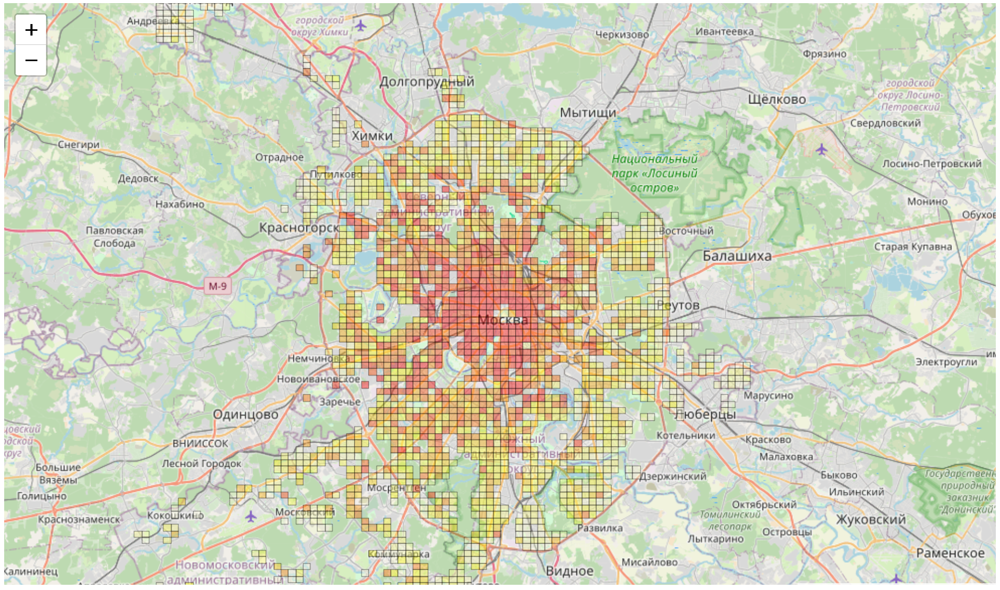

In [ ]:
from IPython.display import Image
print('Видим, что общий паттерн один - при удалении от центра стоимость за квадратный метр падает')

#скриншот, если в гите не отображается
Image(filename='/content/карта.png')

In [ ]:
print('Видим в самом центре светлые пятна - изучим их природу')
print('Топ2 результата - станции метро не из центра')
print('Аномалия вызвана тем, что адресс распознается некорректно')
print('''Ввиду сильной взаимосвязи стоимости и удаленности от центра следует задать примерное значение удаленности от центра
или исключить их из выборки''')
df_clean[df_clean['dist_to_center']<=0].sort_values('price')

Видим в самом центре светлые пятна - изучим их природу
Топ2 результата - станции метро не из центра
Аномалия вызвана тем, что адресс распознается некорректно
Ввиду сильной взаимосвязи стоимости и удаленности от центра следует задать примерное значение удаленности от центра
или исключить их из выборки


,metro,walk_to_metro_flg,address,price,m_sqarea,floor_flat,floor_max,rooms,latitude,longitude,district_name,dist_to_center,r_per_meter,room_square,Холодильник,Посудомоечная машина,Стиральная машина,Кондиционер,Телевизор,Интернет,Мебель на кухне,Мебель в комнатах,Оплата ЖКХ,Залог,Предоплата_месяцев,Срок аренды,С животными,С детьми,Общая площадь,Жилая площадь,Площадь кухни,Санузел,Балкон/лоджия,Вид из окон,Ремонт,Год постройки,Количество лифтов,Тип перекрытий,Парковка,Отопление,Аварийность,school_1000m,shops_200m,theatre_1000m,fitness_500m,cinemas_1500m,foods_1000m,kindergarten_500m,libraries_1000m,parks_2000m,post_office_1000m,climbing_1000m,fields_1000m,indoor_swimming_pool_1000m,malls_2000m,outdoor_swimming_pool_1000m,is_first_floor,is_max_floor,сумма_лифтов,грузовой_лифт,сумма_санузлов,совмещенный,сумма_балконов,балкон,Доля площади кухни,Доля жилой площади,park,school,shops,theatre,fitness,cinemas,foods,kindergarten,libraries,climbing,fields,outdoor_swimming_pool,indoor_swimming_pool,malls,distance_rounded
7993,Нижегородская,True,"Москва, ЮВАО, р-н Текстильщики, м. Нижегородская, Юго-Восточный ао, 90А Грайвороново кв-л, к6",48000.0,35.0,6.0,17.0,1,55.755864,37.617698,Центральный административный округ,0.0,1371.0,35.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,48000.0,1.0,от года,по договоренности,по договоренности,35.0,20.00000,10.000000,1 совмещенный,1 балкон,NaN,Евроремонт,1966.0,"1 пассажирский, 1 грузовой",Железобетонные,Наземная,Центральное,0.0,5,7,10,0,16,522,0,0,73,0,0,0,0,28,0,False,False,2,True,1,True,1,True,0.218750,0.571429,True,True,True,True,False,True,True,False,False,False,False,False,False,True,0.0
9330,Охотный ряд,True,"Москва, ЦАО, р-н Тверской, м. Охотный ряд, Тверская улица, 6С3",115000.0,50.0,4.0,6.0,2,55.761214,37.611158,Центральный административный округ,0.0,2300.0,25.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,счетчики отдельно,115000.0,1.0,от года,по договоренности,по договоренности,50.0,30.00000,10.000000,1 совмещенный,1 балкон,Во двор,Дизайнерский,1930.0,1 пассажирский,Железобетонные,Наземная,Центральное,0.0,23,1,22,2,15,730,0,1,63,0,0,0,0,26,0,False,False,1,False,1,True,1,True,0.147727,0.647689,True,True,True,True,True,True,True,False,True,False,False,False,False,True,0.0
9327,Охотный ряд,True,"Москва, ЦАО, р-н Тверской, м. Охотный ряд, Тверская улица, 6С1",120000.0,66.0,4.0,12.0,2,55.760256,37.611446,Центральный административный округ,0.0,1818.0,33.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,счетчики отдельно,110000.0,1.0,от года,по договоренности,по договоренности,66.0,35.00000,14.000000,1 совмещенный,2 балкона,NaN,Евроремонт,1940.0,"1 пассажирский, 1 грузовой",Нет информации,Наземная,Центральное,0.0,20,1,23,2,16,726,0,1,61,0,0,0,0,25,0,False,False,2,True,1,True,2,True,0.160714,0.566038,True,True,True,True,True,True,True,False,True,False,False,False,False,True,0.0
9321,Охотный ряд,True,"Москва, ЦАО, р-н Тверской, м. Охотный ряд, Газетный переулок, 13С1",135000.0,67.0,10.0,11.0,2,55.758894,37.609398,Центральный административный округ,0.0,2014.0,33.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,счетчики отдельно,135000.0,1.0,от года,по договоренности,по договоренности,67.0,42.00000,10.000000,1 раздельный,1 балкон,Во двор,Евроремонт,1956.0,"1 пассажирский, 1 грузовой",Нет информации,Наземная,Нет информации,0.0,21,3,21,0,14,707,1,2,61,0,0,0,0,26,0,False,False,2,True,1,False,1,True,0.156326,0.608621,True,True,True,True,False,True,True,True,True,False,False,False,False,True,0.0
9326,Охотный ряд,True,"Москва, ЦАО, р-н Тверской, м. Охотный ряд, Тверская улица, 4",138000.0,75.0,4.0,8.0,2,55.758493,37.613198,Центральный административный округ,0.0,1840.0,37.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,счетчики отдельно,138000.0,1.0,от года,по договоренности,по договоренности,75.0,40.00000,12.000000,1 совмещенный,1 балкон,На улицу,Косметический,1938.0,1 пассажирский,Нет информации,Наземная,Центральное,0.0,10,1,20,0,15,661,0,2,62,0,0,0,0,27,0,False,False,1,False,1,True,1,True,0.154560,0.601504,True,True,True,True,False,True,True,False,True,Fals

Также в данных наблюдается два адреса, расположение которых идентифицируется как центр Москвы, в то время как они имеют конкретные адрса. Удалим их.

In [ ]:
condition = df_clean['dist_to_center'] <= 0
df_clean = df_clean[~condition]

####**Тепловая карта индекса пешеходной доступности**


In [ ]:
from typing_extensions import DefaultDict
df_clean['education_access'] = df_clean[['school_1000m', 'kindergarten_500m', 'libraries_1000m']].sum(axis=1)
df_clean['commerce_access'] = df_clean[['shops_200m', 'malls_2000m', 'post_office_1000m']].sum(axis=1)
df_clean['entertainment_access'] = df_clean[['theatre_1000m', 'cinemas_1500m', 'foods_1000m']].sum(axis=1)
df_clean['sport_access'] = df_clean[['fitness_500m', 'climbing_1000m', 'fields_1000m',
                                     'indoor_swimming_pool_1000m', 'outdoor_swimming_pool_1000m']].sum(axis=1)
df_clean['green_zones_access'] = df_clean['parks_2000m']

In [ ]:
df_clean['walkability_index'] = (
    df_clean['education_access'] * 0.3 +
    df_clean['commerce_access'] * 0.3 +
    df_clean['entertainment_access'] * 0.2 +
    df_clean['sport_access'] * 0.2 +
    df_clean['green_zones_access'] * 0.1
)

In [ ]:
df_clean['walkability_to_price_ratio'] = df_clean['walkability_index'] / df_clean['r_per_meter'];

**Тепловая карта отношение индекса пеш доступности к цене за метр - выше/ниже медианы**

In [ ]:
from folium.plugins import HeatMap
map_center = [df_clean['latitude'].mean(), df_clean['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=11)
for _, row in df_clean.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='green' if row['walkability_to_price_ratio'] > df_clean['walkability_to_price_ratio'].median() else 'red',
        fill=True,
        fill_opacity=0.6,
        popup=f"Цена: {row['price']} руб.\nWalkability: {row['walkability_index']}"
    ).add_to(m)

m

Видим, что общий паттерн один - при удалении от центра объектов с отношением доступности к цене за метр ниже среднего становится больше


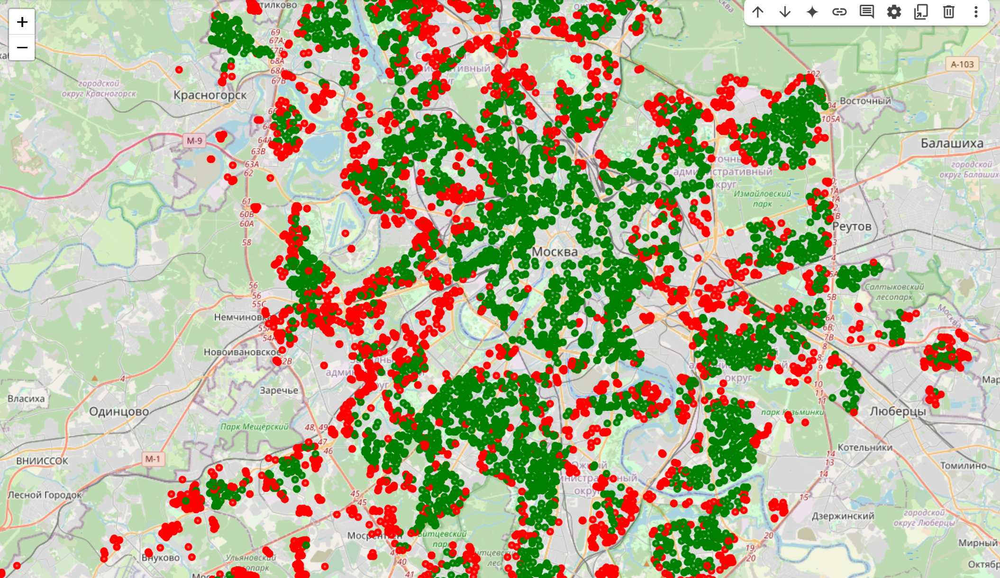

In [ ]:
from IPython.display import Image
print('Видим, что общий паттерн один - при удалении от центра объектов с отношением доступности к цене за метр ниже среднего становится больше')

#скриншот, если в гите не отображается
Image(filename='/content/индекс01.png')

In [ ]:
map_center = [df_clean['latitude'].mean(), df_clean['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=11)

min_val = df_clean["walkability_to_price_ratio"].min()
max_val = df_clean["walkability_to_price_ratio"].max()

colormap = cm.LinearColormap(
    colors=["blue", "green", "yellow", "orange", "red"],
    vmin=min_val, vmax=max_val
)

m = folium.Map(location=map_center, zoom_start=11)

for _, row in df_clean.iterrows():
    folium.CircleMarker(
        location=(row["latitude"], row["longitude"]),
        radius=3,
        color=colormap(row["walkability_to_price_ratio"]),
        fill=True,
        fill_color=colormap(row["walkability_to_price_ratio"]),
        fill_opacity=0.7,
        popup=f"Цена: {row['price']} руб.\nЗа метр: {row['r_per_meter']} руб.\nПешеходная доступность: {row['walkability_index']}"
    ).add_to(m)

colormap.caption = "Соотношение пешеходной доступности к цене"
colormap.add_to(m)

m

Видим, что общий паттерн один - при удалении от центра объектов с отношением доступности к цене за метр становится больше


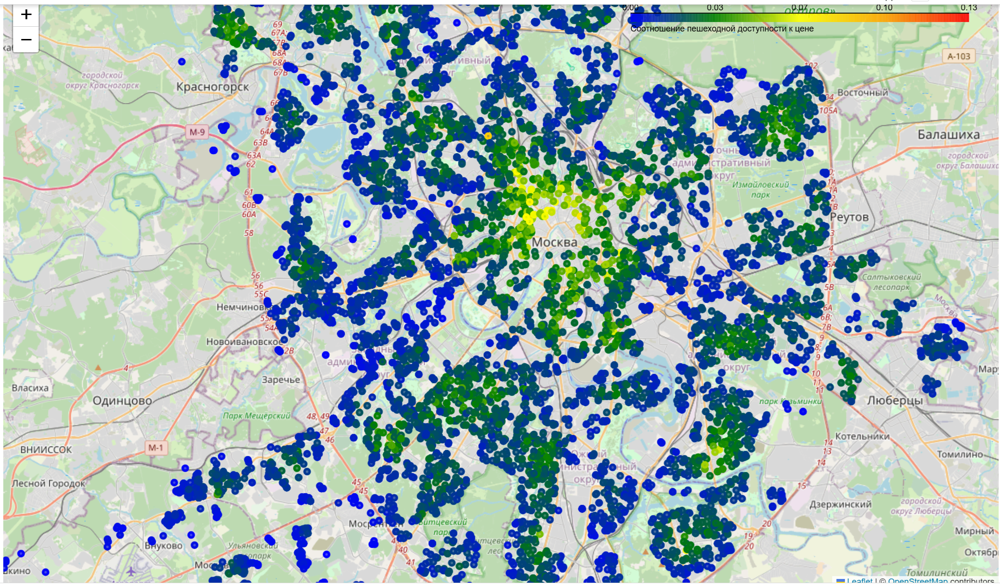

In [ ]:
from IPython.display import Image
print('Видим, что общий паттерн один - при удалении от центра объектов с отношением доступности к цене за метр становится больше')

#скриншот, если в гите не отображается
Image(filename='/content/индекс_color.png')

### 4. Выводы. Исключение дублирующих столбцов.

**Выводы:**

При удалении от центра цена за кв.м снижается.

Самые дорогие квартиры расположены в домах, построенных ранее 1955 г. Скорее это говорит о том, что данные квартиры расположены в центральной части города.

В Центральном округе цены заметно выше. Но самое большое количество предложений представлено в Западном округе.

Количество предложений о сдаче квартир в домах начиная с 2017 года постройки и позже гораздо выше. Самое большое количество предложений наблюдается в домах построеных начниая с 2021 года.

Далее скачек цен на квартиры наблюдается для домов, построенных в 2016 году и позднее.

Цена для первых этажей ниже.

Пешеходная доступность до метро, наличие кондиционера и посудомоечной машины, наличие грузового лифта, подземной парковки и дизайнерского ремонта значительно повышает ценник.

Отсутсвие балкона повышает цену, что странно. Должно быть замена пропусков для балконов на "нет" дает искажение. Возможно, стоит это признак удалить.

В таблице обнаружены признаки, не влияющие на ценообразованиe. А также присутсвуют дублирующие признаки такие как "Залог" и "price", "Общая площадь" и "m_sqarea" и пр.

Такие признаки следует удалить.

Также обнаружены признаки, которые зависят друг от друга, например количество парков больше ближе к центру города или количество соц.объектов больше около более старых домов.

 С учетом того, что признак для предсказаний - "r_per_meter", удалим лишние столбцы.

 Часть признаков по количеству объектов обслуживания имеет множество выбросов. Чтобы не терять большую часть данных, создали доп.признаки, обозначающие наличие того или иного объекта

In [549]:
# Исключаем дублирующие признаки
df_clean = df_clean.drop(columns=["metro", "latitude", "longitude", "address",
                                  "price", "Залог", "Предоплата_месяцев", "Общая площадь",
                                  "Жилая площадь", "distance_rounded",
                                  "Аварийность", "Количество лифтов", "Санузел", "Балкон/лоджия",
                                  "Вид из окон", "Доля площади кухни", "Доля жилой площади"])

In [550]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12851 entries, 0 to 16059
Data columns (total 64 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   walk_to_metro_flg            12851 non-null  bool   
 1   m_sqarea                     12851 non-null  float64
 2   floor_flat                   12851 non-null  float64
 3   floor_max                    12851 non-null  float64
 4   rooms                        12851 non-null  int64  
 5   district_name                12851 non-null  object 
 6   dist_to_center               12851 non-null  float64
 7   r_per_meter                  12851 non-null  float64
 8   room_square                  12851 non-null  float64
 9   Холодильник                  12851 non-null  float64
 10  Посудомоечная машина         12851 non-null  float64
 11  Стиральная машина            12851 non-null  float64
 12  Кондиционер                  12851 non-null  float64
 13  Телевизор            


Данные готовы для дальнейшей работы.

In [551]:
df_clean.to_csv('data_clean.csv', index=False)